In [4]:
import pandas as pd
from datetime import datetime
from sklearn.linear_model import LinearRegression

In [5]:
data=pd.read_csv('/content/dataset_solution_challenge.csv')

In [6]:
data.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Delhi,01-01-2015,313.22,607.98,69.16,36.39,110.59,33.85,15.20,9.25,41.68,14.36,24.86,9.84,472.0,Severe
1,Delhi,02-01-2015,186.18,269.55,62.09,32.87,88.14,31.83,9.54,6.65,29.97,10.55,20.09,4.29,454.0,Severe
2,Delhi,03-01-2015,87.18,131.90,25.73,30.31,47.95,69.55,10.61,2.65,19.71,3.91,10.23,1.99,143.0,Moderate
3,Delhi,04-01-2015,151.84,241.84,25.01,36.91,48.62,130.36,11.54,4.63,25.36,4.26,9.71,3.34,319.0,Very Poor
4,Delhi,05-01-2015,146.60,219.13,14.01,34.92,38.25,122.88,9.20,3.33,23.20,2.80,6.21,2.96,325.0,Very Poor


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2009 entries, 0 to 2008
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        2009 non-null   object 
 1   Date        2009 non-null   object 
 2   PM2.5       2007 non-null   float64
 3   PM10        1932 non-null   float64
 4   NO          2007 non-null   float64
 5   NO2         2007 non-null   float64
 6   NOx         2009 non-null   float64
 7   NH3         2000 non-null   float64
 8   CO          2009 non-null   float64
 9   SO2         1899 non-null   float64
 10  O3          1925 non-null   float64
 11  Benzene     2009 non-null   float64
 12  Toluene     2009 non-null   float64
 13  Xylene      1228 non-null   float64
 14  AQI         1999 non-null   float64
 15  AQI_Bucket  1999 non-null   object 
dtypes: float64(13), object(3)
memory usage: 251.2+ KB


In [9]:
data = data.fillna(data.median(numeric_only=True))

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2009 entries, 0 to 2008
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        2009 non-null   object 
 1   Date        2009 non-null   object 
 2   PM2.5       2009 non-null   float64
 3   PM10        2009 non-null   float64
 4   NO          2009 non-null   float64
 5   NO2         2009 non-null   float64
 6   NOx         2009 non-null   float64
 7   NH3         2009 non-null   float64
 8   CO          2009 non-null   float64
 9   SO2         2009 non-null   float64
 10  O3          2009 non-null   float64
 11  Benzene     2009 non-null   float64
 12  Toluene     2009 non-null   float64
 13  Xylene      2009 non-null   float64
 14  AQI         2009 non-null   float64
 15  AQI_Bucket  1999 non-null   object 
dtypes: float64(13), object(3)
memory usage: 251.2+ KB


In [11]:
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2009 entries, 0 to 2008
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   City        2009 non-null   object        
 1   Date        2009 non-null   datetime64[ns]
 2   PM2.5       2009 non-null   float64       
 3   PM10        2009 non-null   float64       
 4   NO          2009 non-null   float64       
 5   NO2         2009 non-null   float64       
 6   NOx         2009 non-null   float64       
 7   NH3         2009 non-null   float64       
 8   CO          2009 non-null   float64       
 9   SO2         2009 non-null   float64       
 10  O3          2009 non-null   float64       
 11  Benzene     2009 non-null   float64       
 12  Toluene     2009 non-null   float64       
 13  Xylene      2009 non-null   float64       
 14  AQI         2009 non-null   float64       
 15  AQI_Bucket  1999 non-null   object        
dtypes: datetime64[ns](1), fl

In [13]:
# Getting summary statistics for specific columns
specific_columns_summary = data[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']].describe()
specific_columns_summary

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000,2009.000000
mean,117.173678,232.192952,38.973863,50.781563,58.567023,41.979423,1.976053,15.821792,51.035794,3.544480,17.185042,1.131872,259.475361
std,82.874704,119.553356,33.374894,22.685704,37.690350,17.264428,2.560253,7.752520,25.548586,2.431232,15.291597,1.898028,119.239437
min,10.240000,18.590000,3.570000,10.630000,0.000000,6.780000,0.000000,2.340000,6.940000,0.000000,0.000000,0.000000,29.000000
25%,57.100000,138.810000,15.900000,33.900000,31.150000,31.220000,0.910000,10.460000,34.080000,1.870000,6.650000,0.410000,162.000000
50%,94.620000,216.730000,27.200000,47.150000,52.750000,38.040000,1.240000,14.450000,44.440000,2.960000,12.750000,0.650000,257.000000
75%,152.990000,307.380000,50.720000,63.570000,75.360000,48.680000,1.870000,19.360000,59.880000,4.680000,23.200000,0.910000,345.000000
max,685.360000,796.880000,221.030000,162.500000,254.800000,166.700000,30.440000,71.560000,257.730000,20.640000,103.000000,23.300000,716.000000


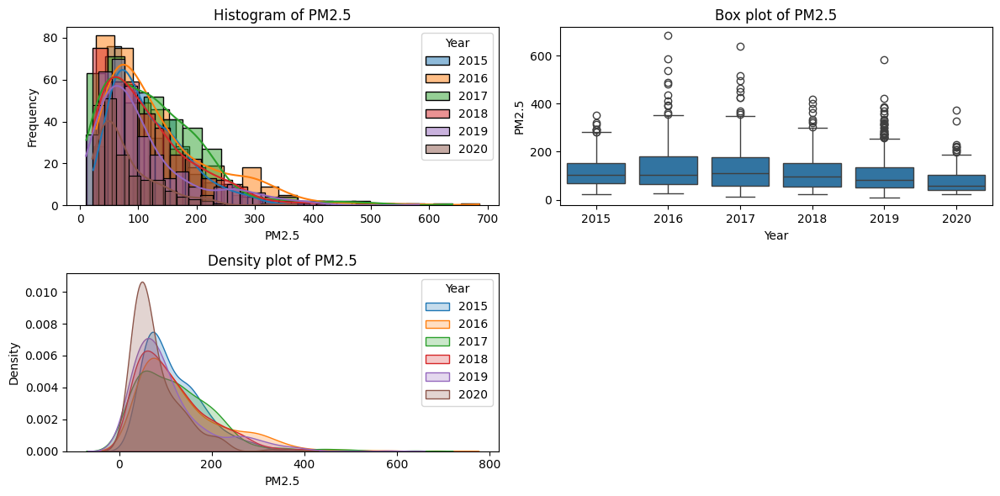

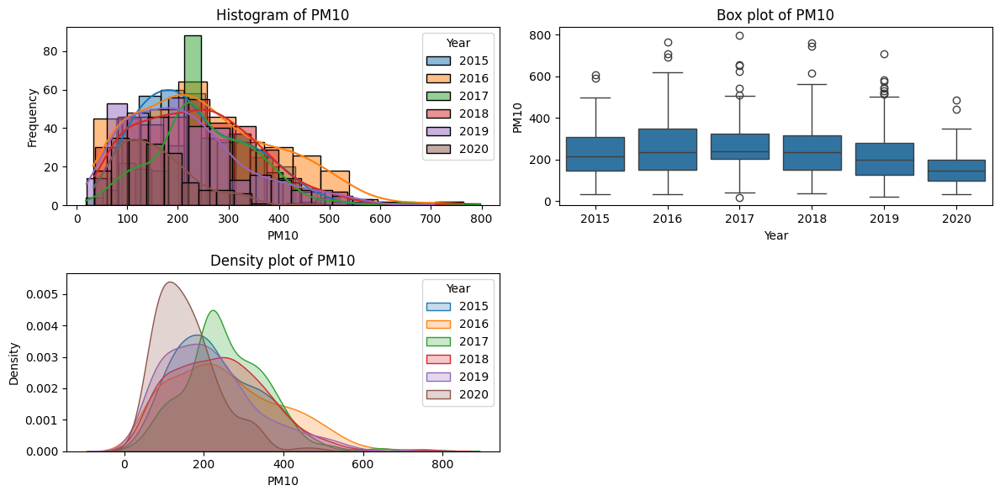

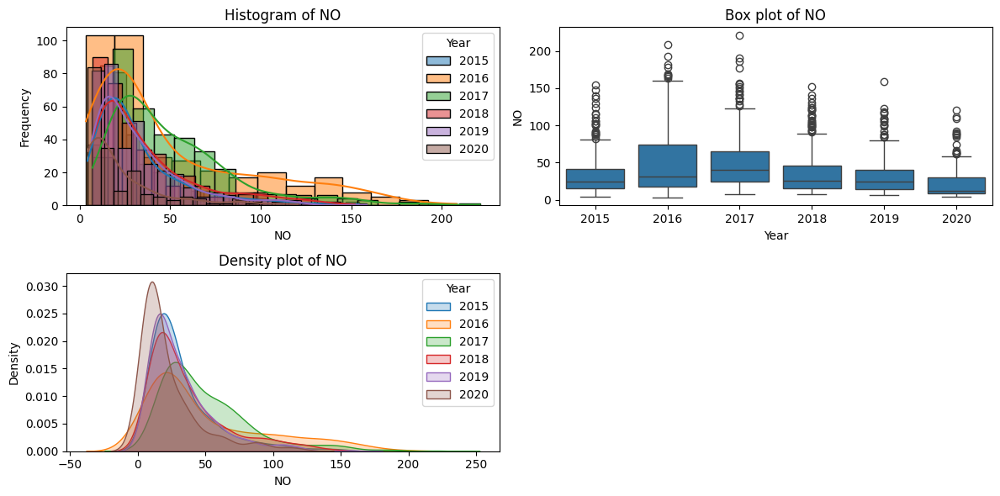

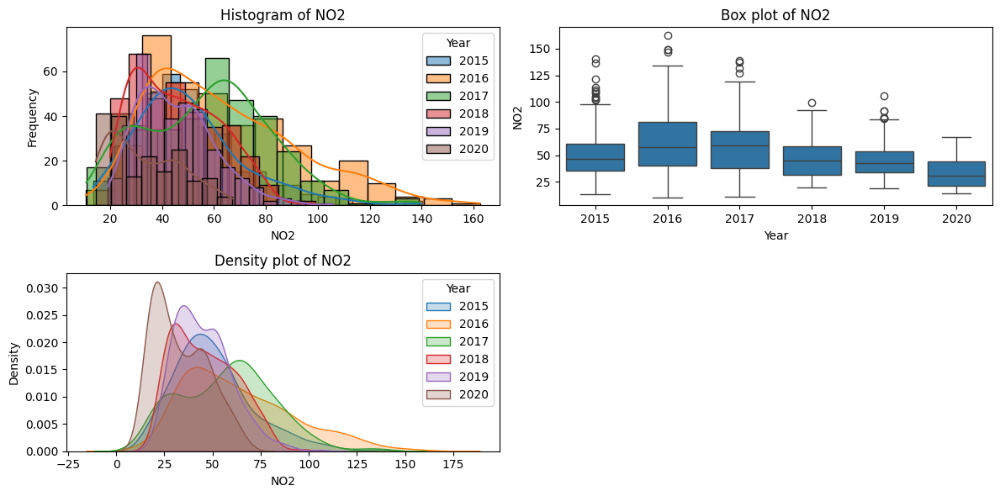

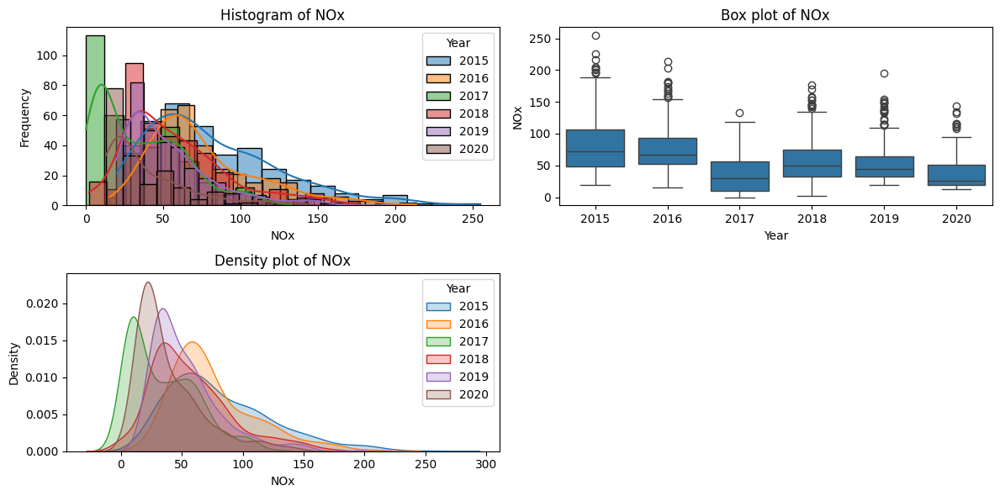

...

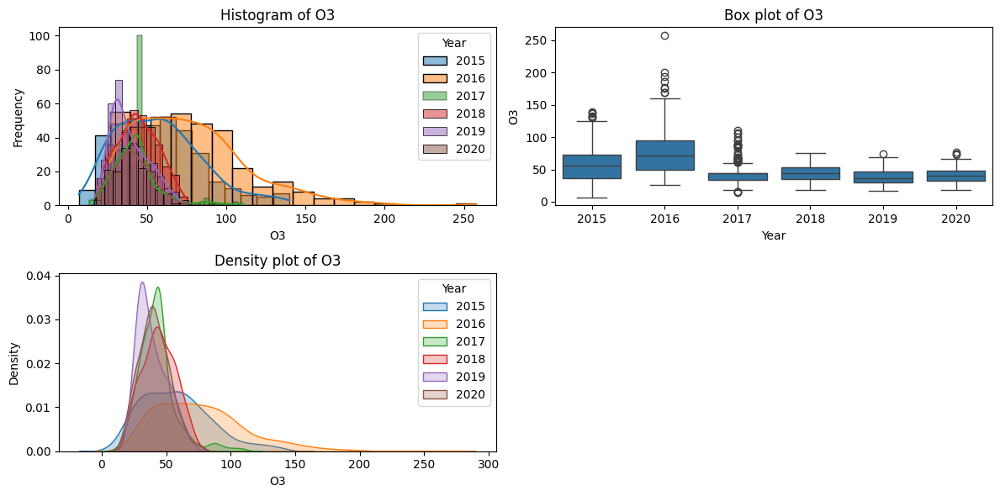

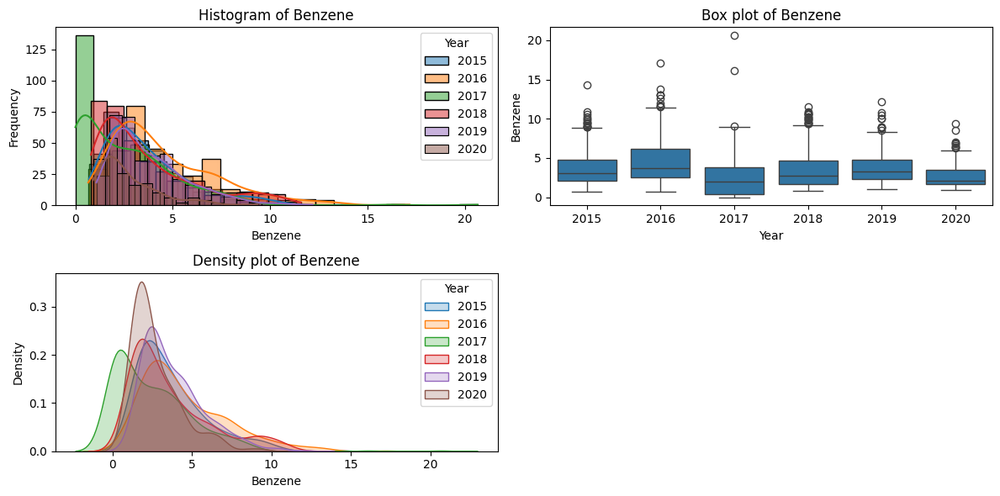

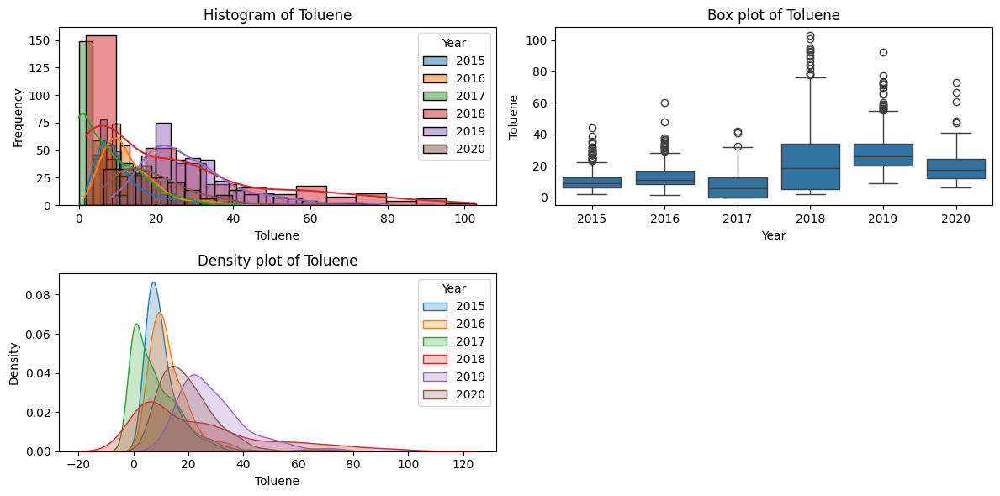

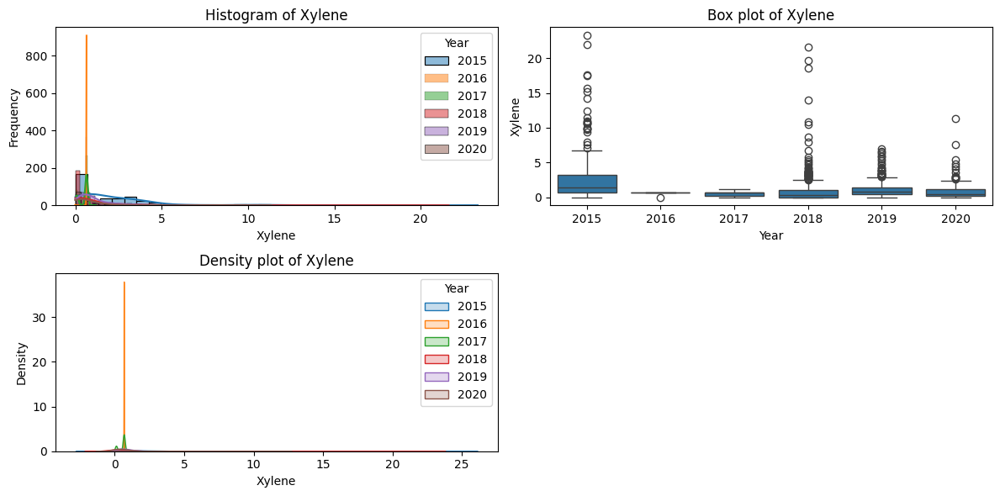

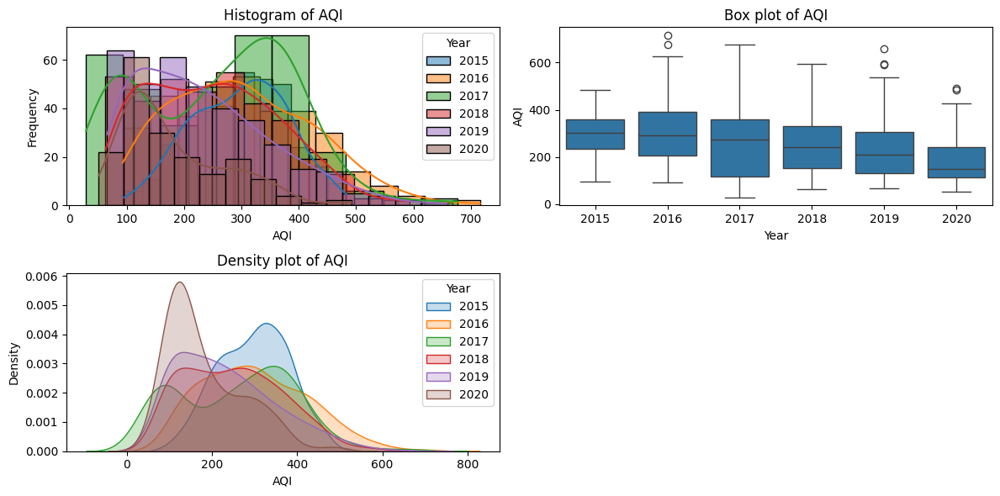

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extracting year from the 'Date' column
data['Year'] = data['Date'].dt.year

# List of numerical features
numerical_features = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']

# Loop over each numerical feature
for feature in numerical_features:
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(2, 2, 1)
    for year, year_data in data.groupby('Year'):
        sns.histplot(data=year_data, x=feature, kde=True, label=year)
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Year')

    # Box plot
    plt.subplot(2, 2, 2)
    sns.boxplot(data=data, x='Year', y=feature)
    plt.title(f'Box plot of {feature}')
    plt.xlabel('Year')
    plt.ylabel(feature)

    # Density plot
    plt.subplot(2, 2, 3)
    for year, year_data in data.groupby('Year'):
        sns.kdeplot(data=year_data, x=feature, fill=True, label=year)
    plt.title(f'Density plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend(title='Year')

    plt.tight_layout()
    plt.show()


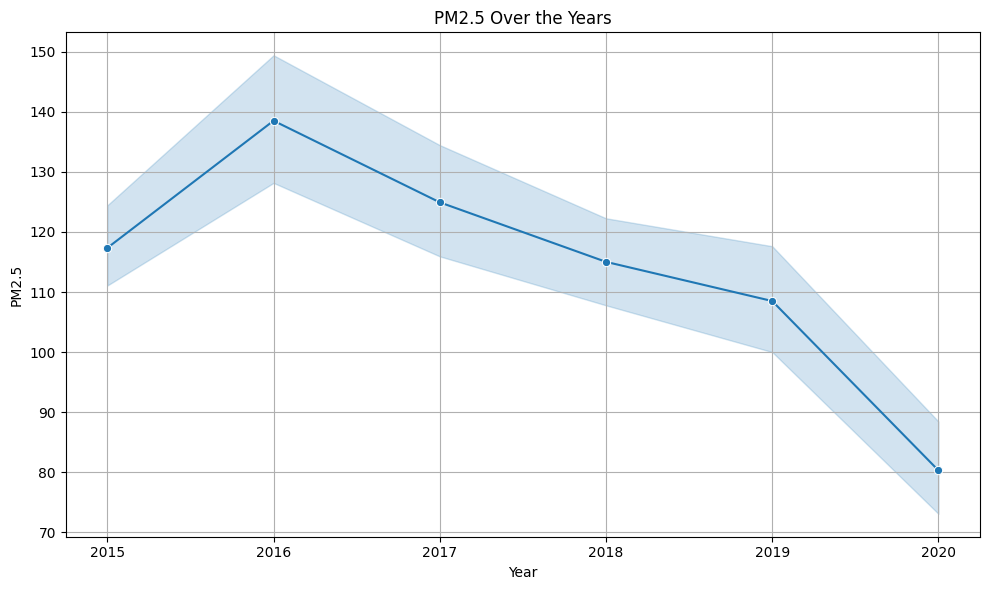

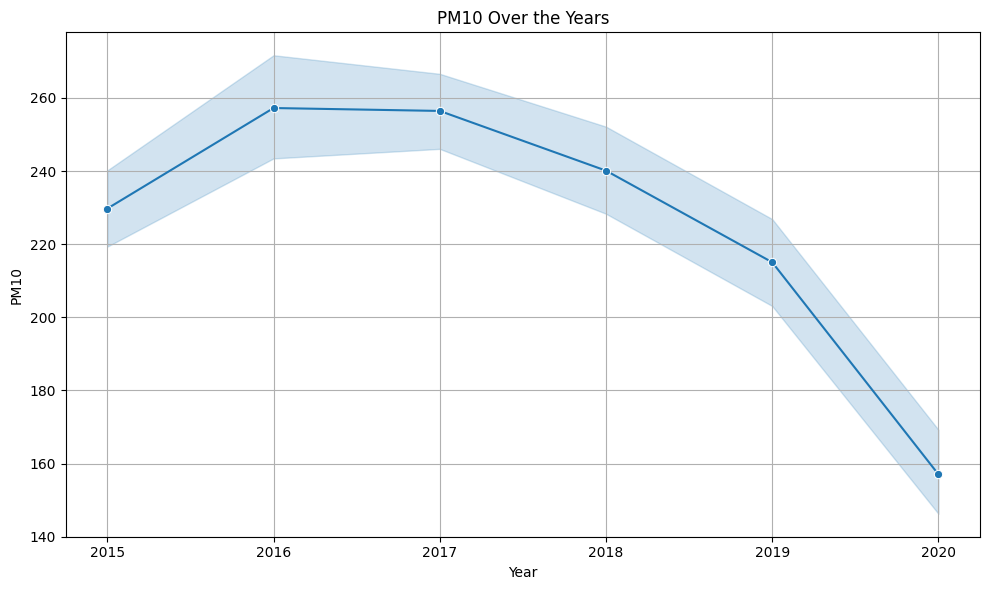

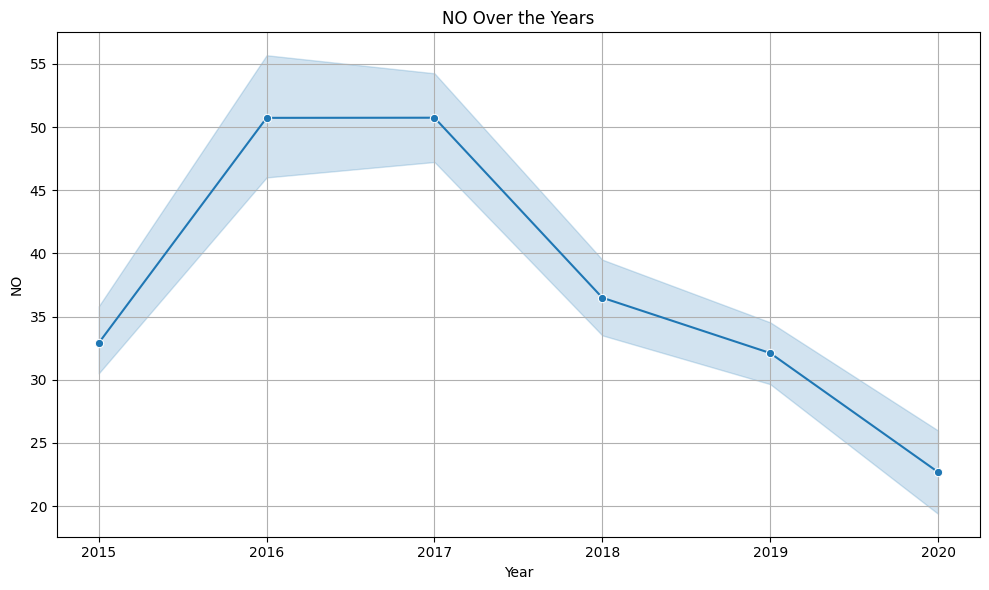

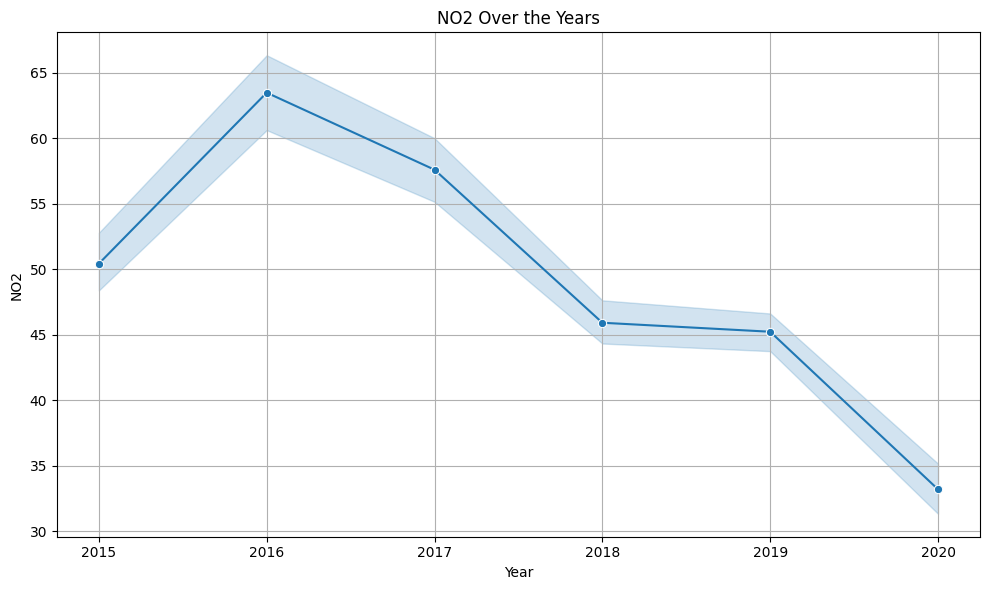

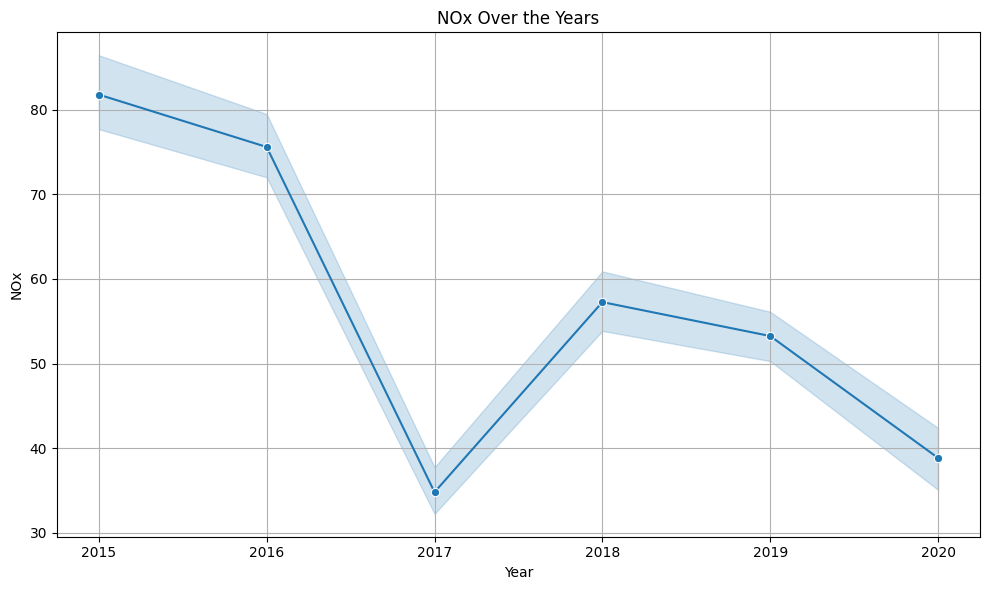

...

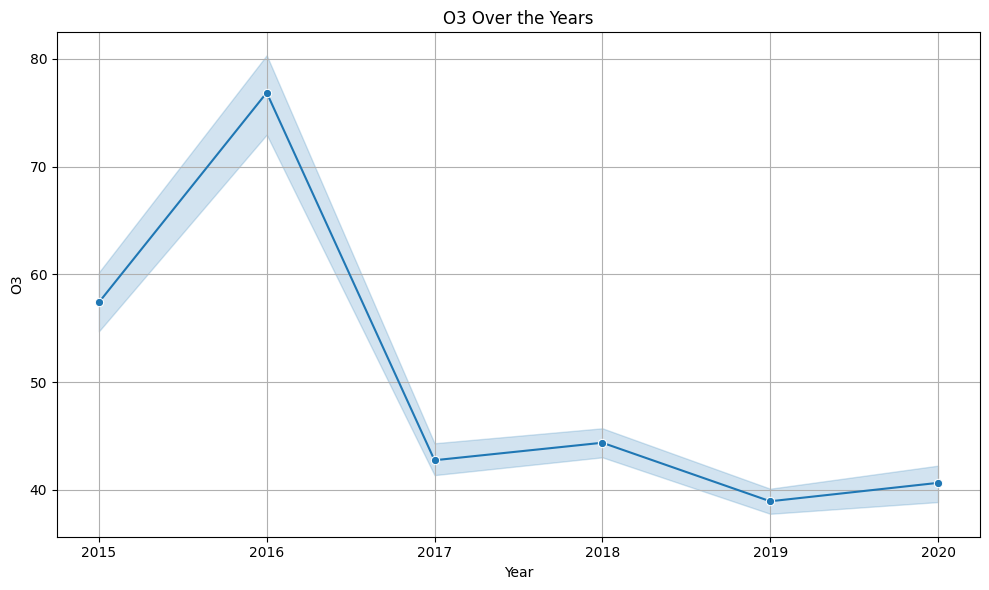

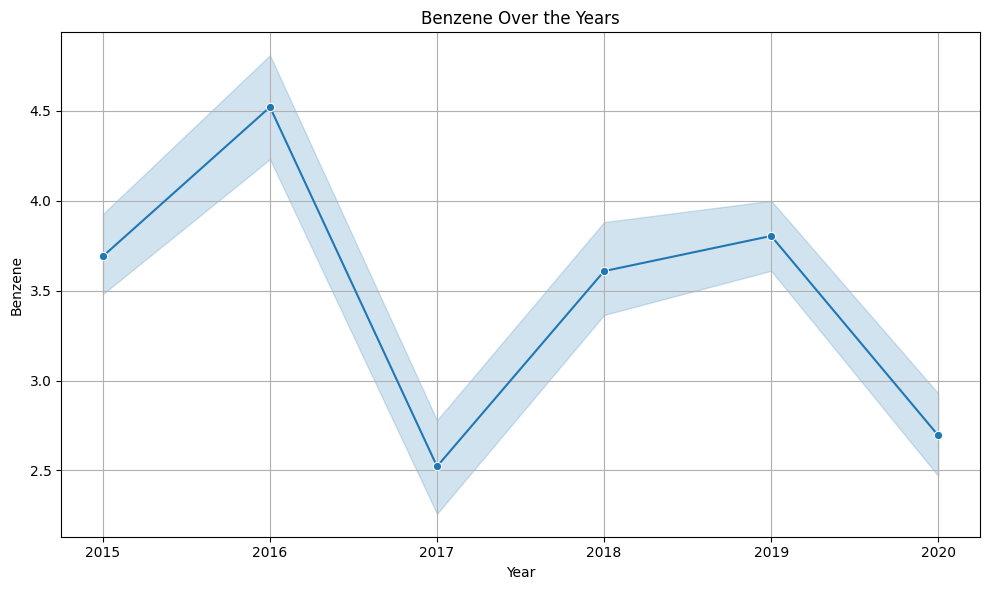

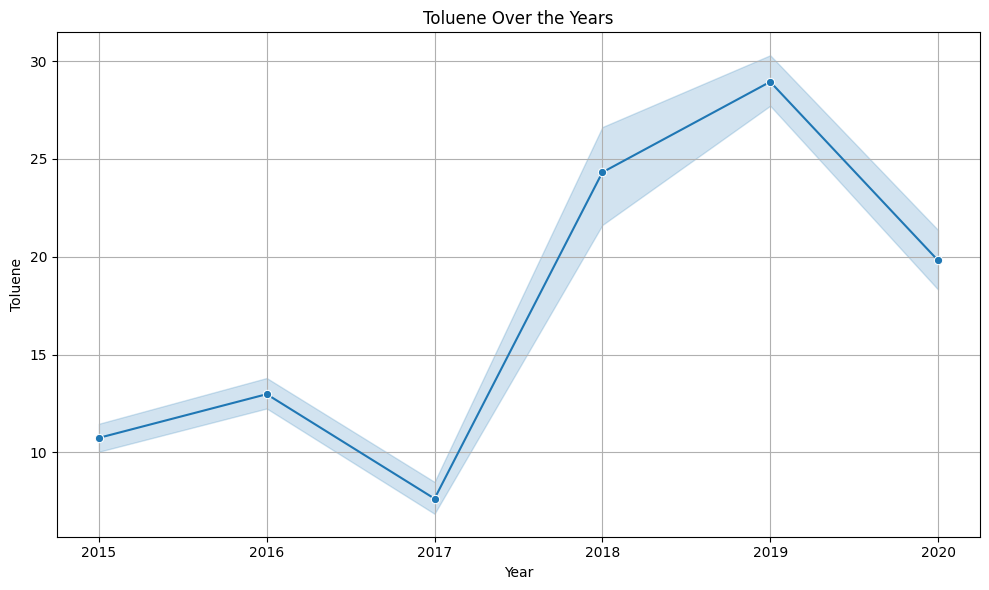

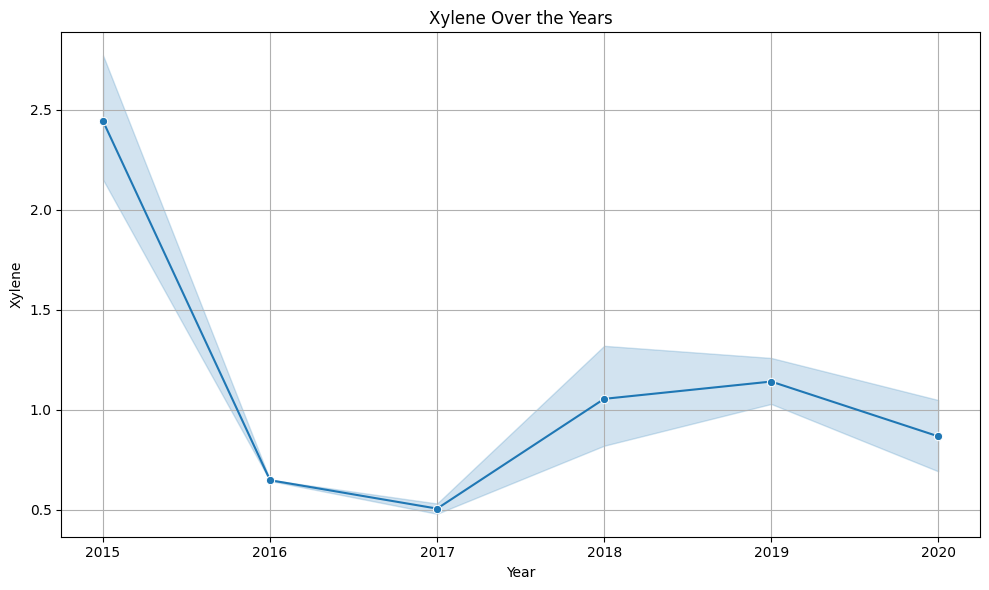

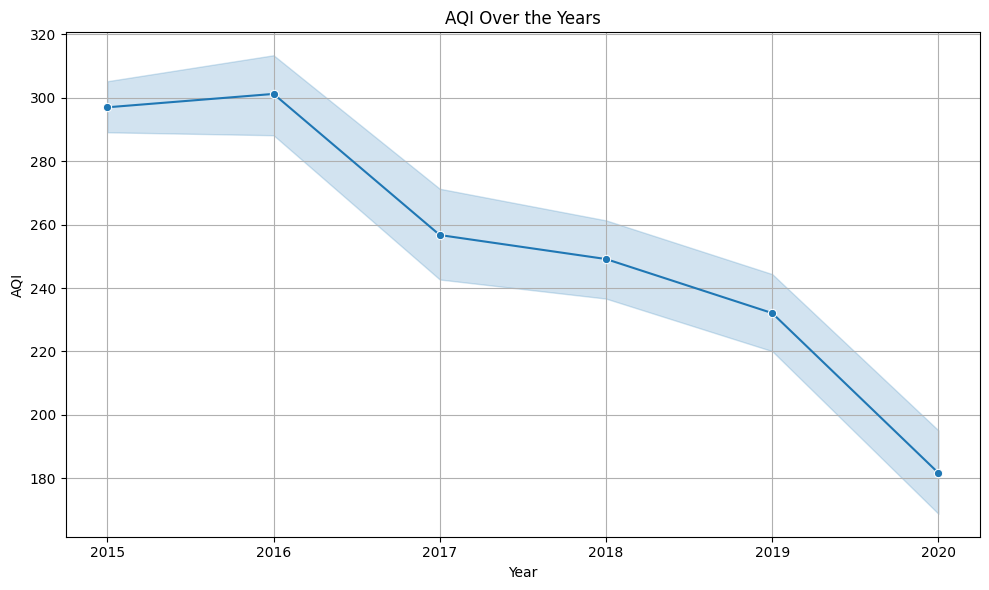

In [15]:
# Loop over each numerical feature
for feature in numerical_features:
    plt.figure(figsize=(10, 6))

    # Plotting curve graph for each feature
    sns.lineplot(data=data, x='Year', y=feature, marker='o')

    plt.title(f'{feature} Over the Years')
    plt.xlabel('Year')
    plt.ylabel(feature)
    plt.grid(True)

    plt.tight_layout()
    plt.show()


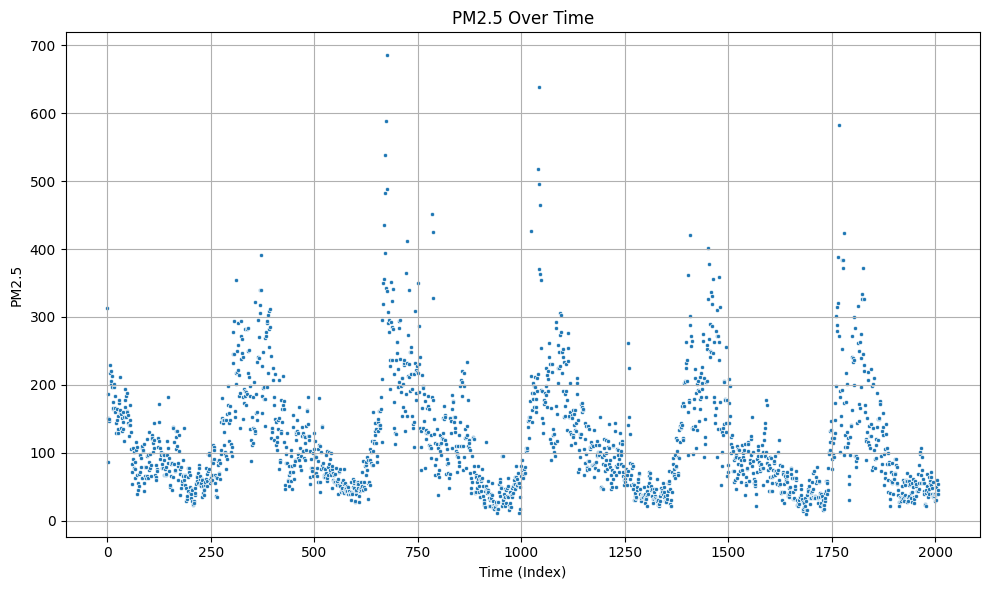

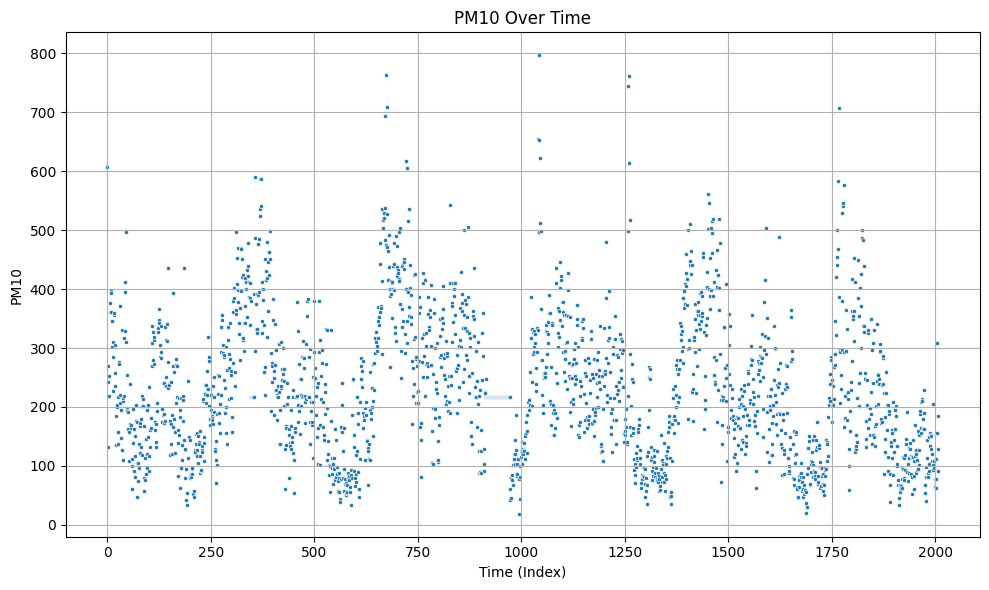

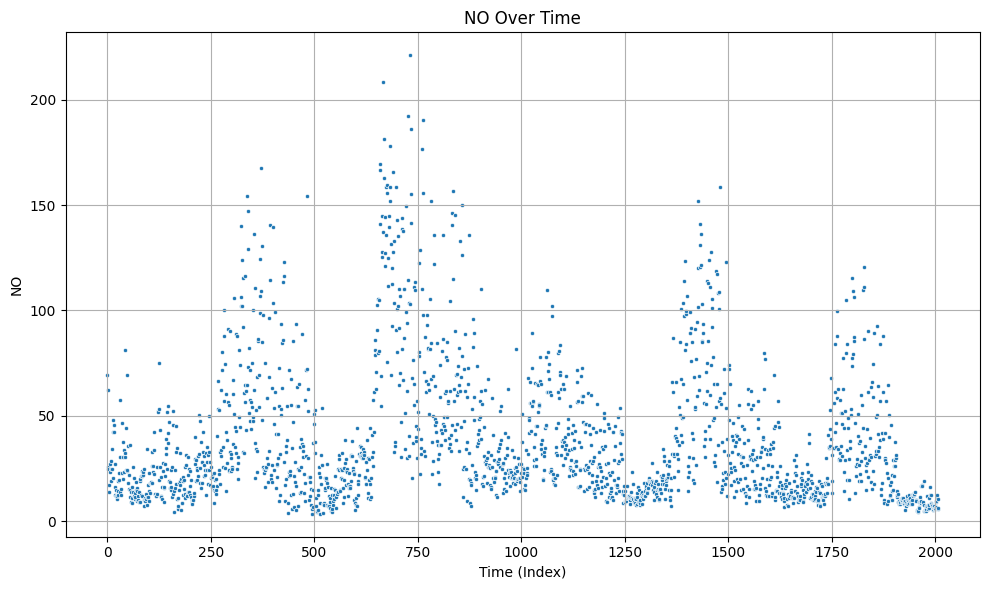

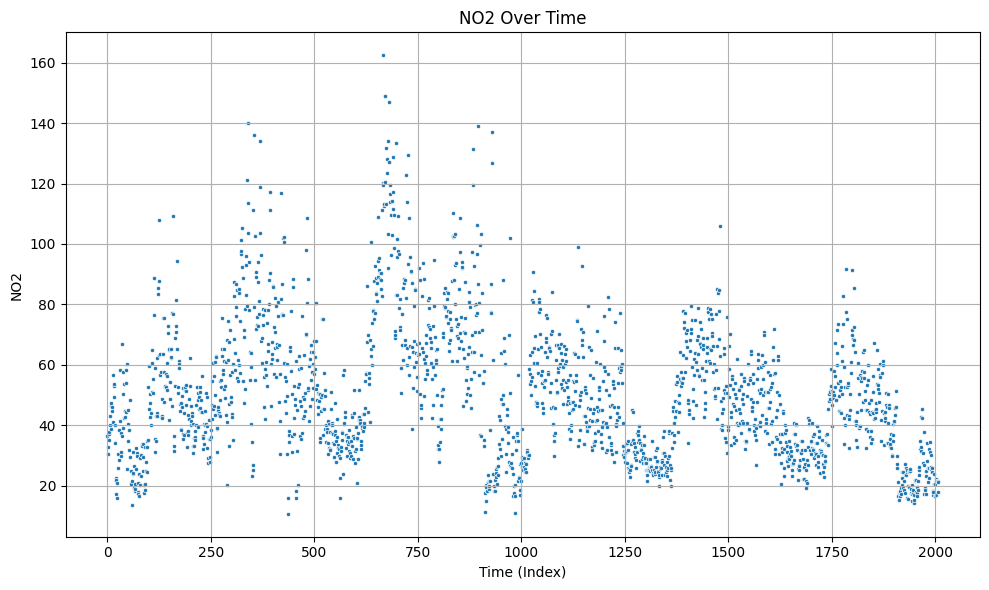

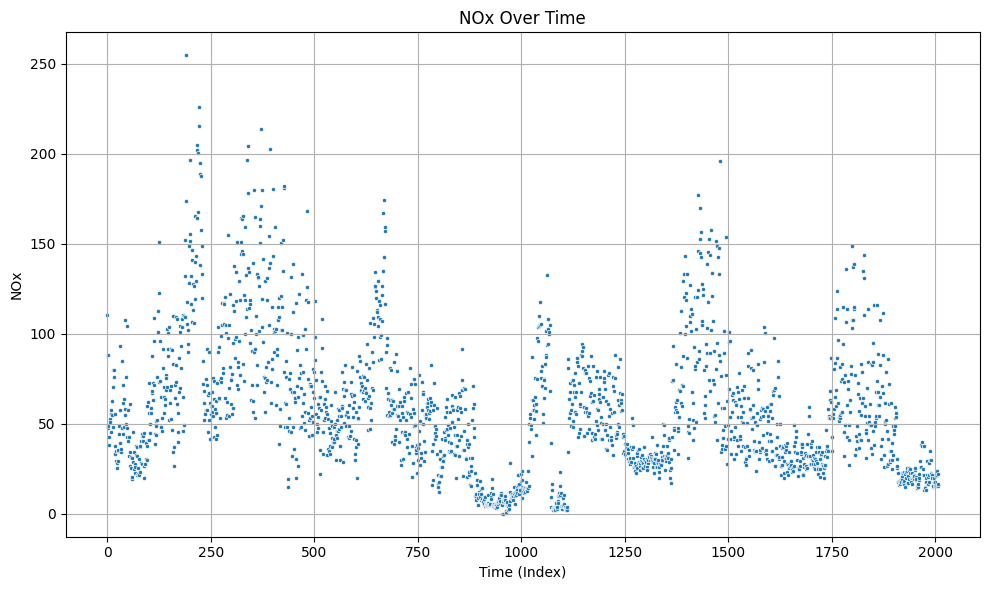

...

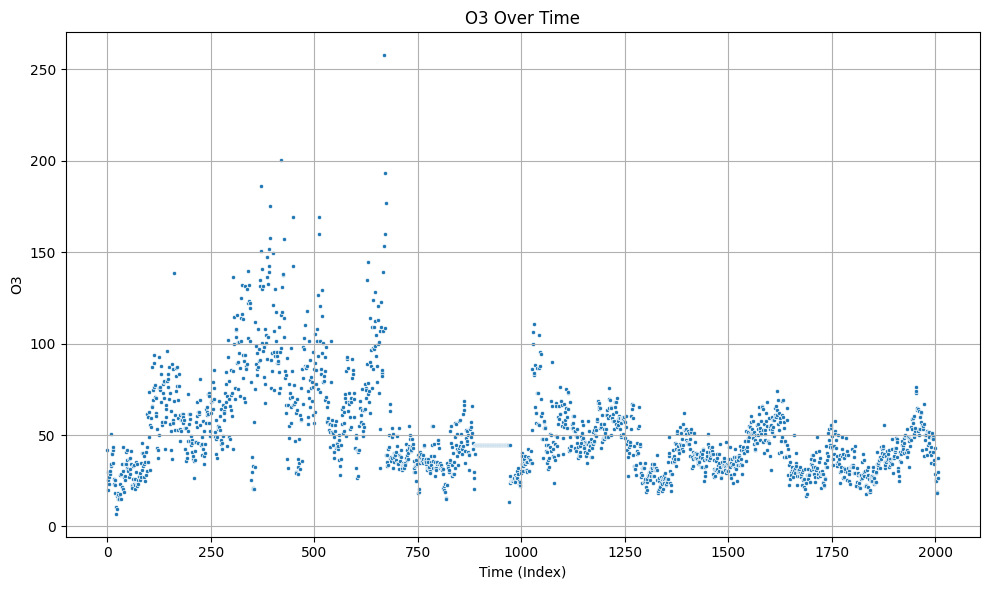

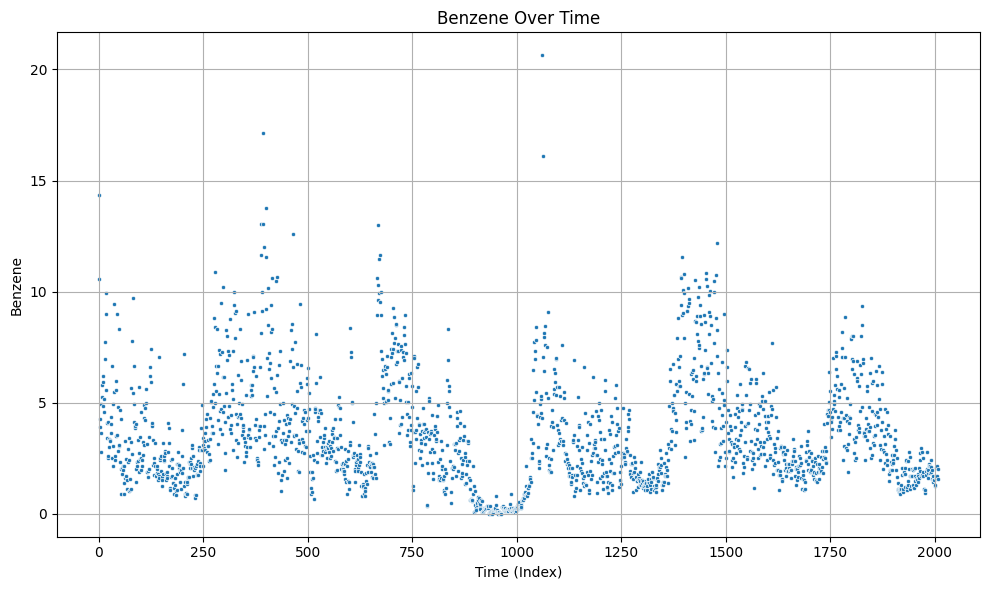

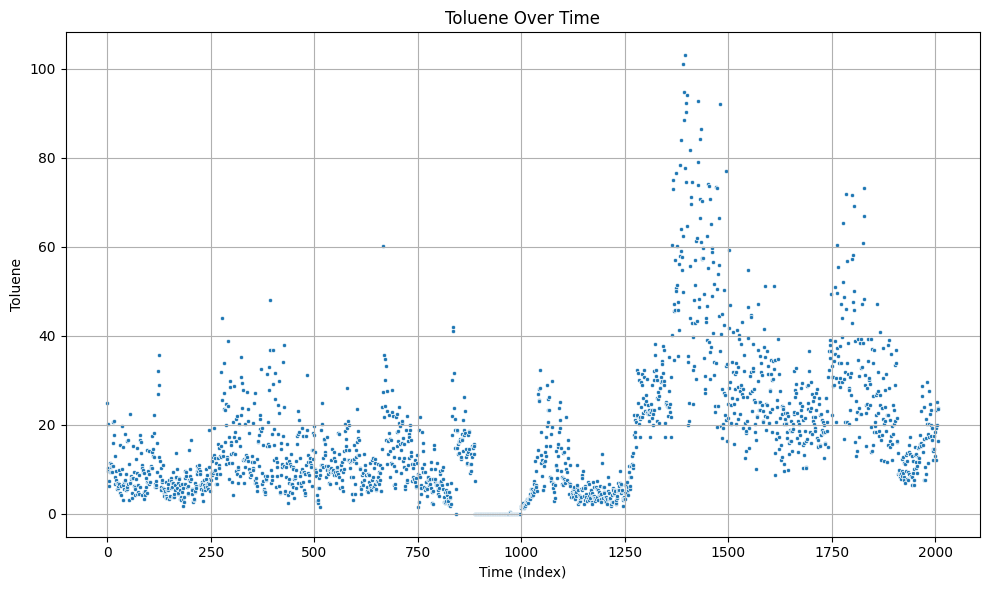

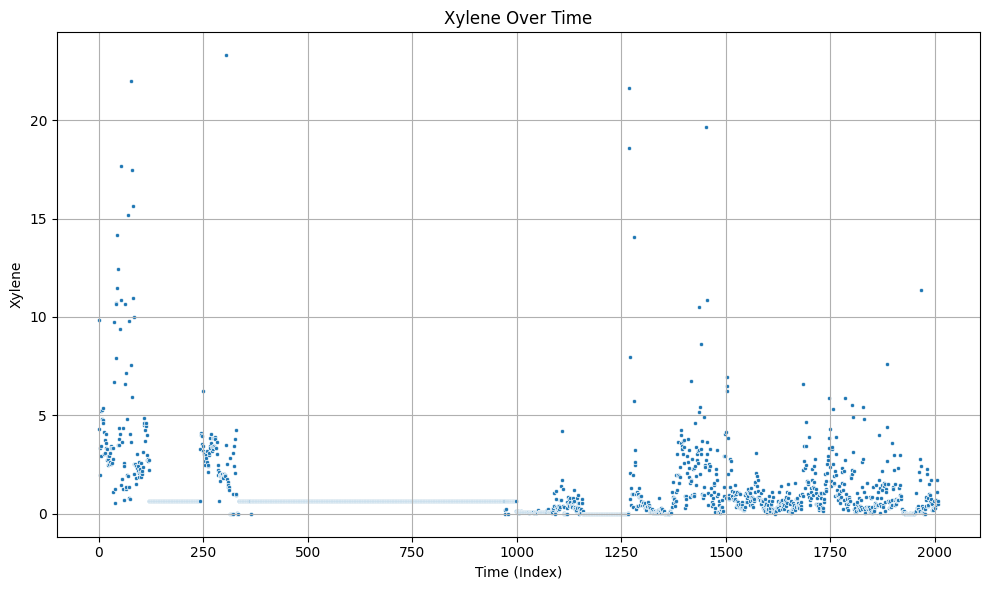

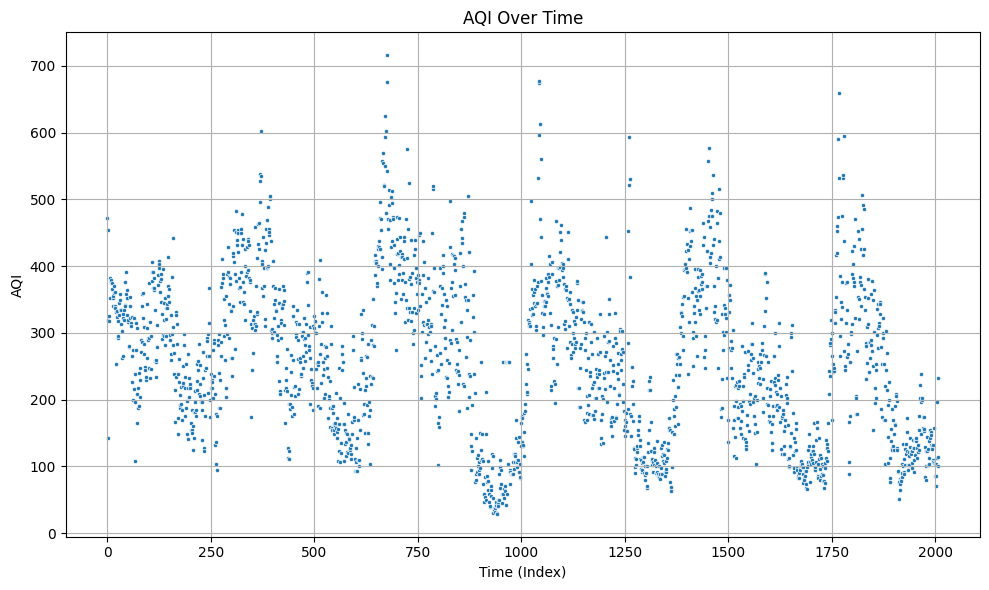

In [16]:
for feature in numerical_features:
    plt.figure(figsize=(10, 6))

    # Plotting scatter plot for each feature
    sns.scatterplot(data=data, x=data.index, y=feature, marker='.')

    plt.title(f'{feature} Over Time')
    plt.xlabel('Time (Index)')
    plt.ylabel(feature)
    plt.grid(True)

    plt.tight_layout()
    plt.show()

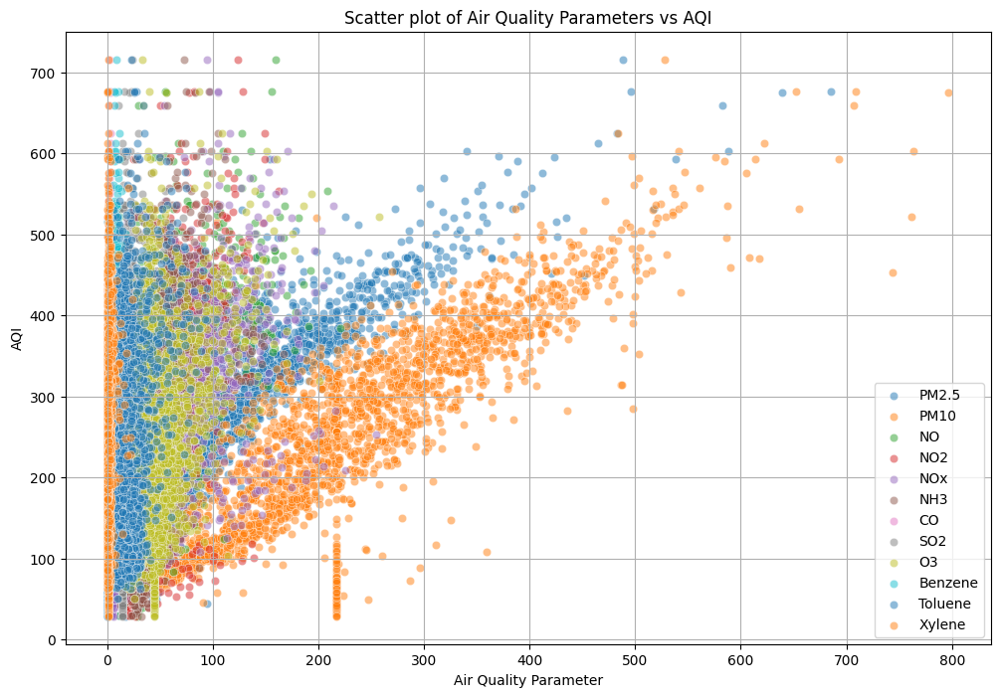

In [17]:
# Scatter plot for each air quality parameter vs AQI
plt.figure(figsize=(12, 8))
for feature in ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']:
    sns.scatterplot(data=data, x=feature, y='AQI', label=feature, alpha=0.5)
plt.title('Scatter plot of Air Quality Parameters vs AQI')
plt.xlabel('Air Quality Parameter')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

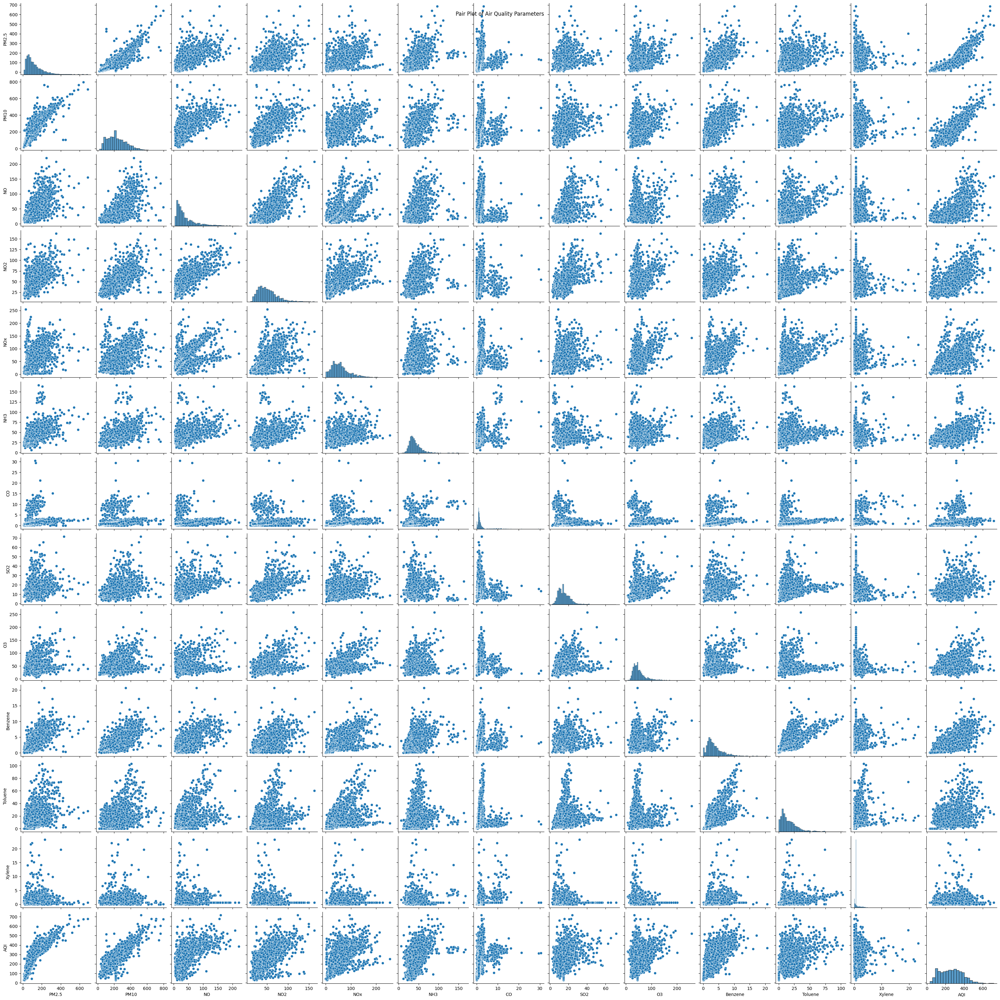

In [18]:
# Pair plot
sns.pairplot(data=data[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']])
plt.suptitle('Pair Plot of Air Quality Parameters')
plt.show()


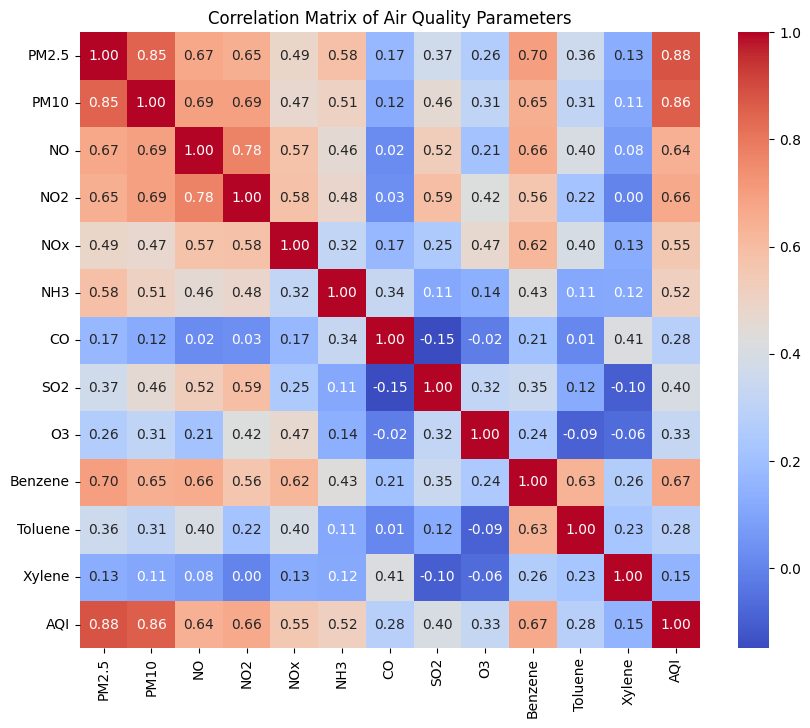

In [19]:
# Correlation matrix
correlation_matrix = data[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Air Quality Parameters')
plt.show()


<ipython-input-20-91d7f756b961>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data, x='AQI_Bucket', order=data['AQI_Bucket'].value_counts().index, palette=palette_colors)


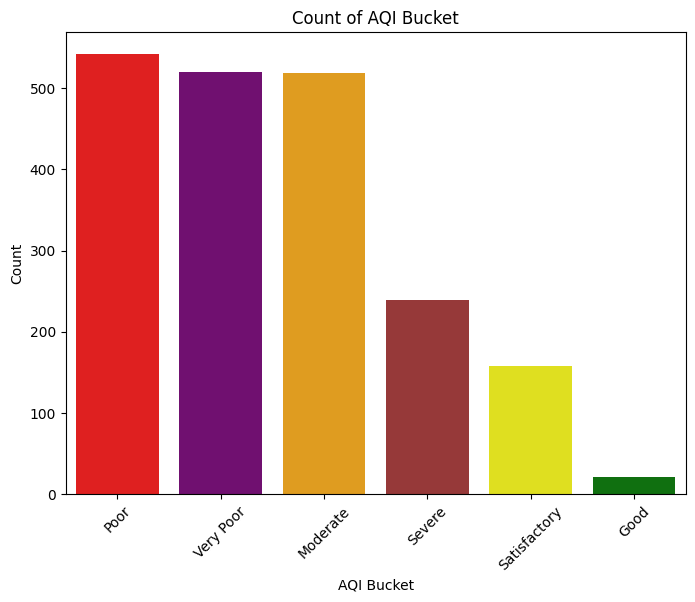

In [20]:
# Define colors for each AQI bucket category
palette_colors = {'Good': 'green', 'Satisfactory': 'yellow', 'Moderate': 'orange', 'Poor': 'red', 'Very Poor': 'purple', 'Severe': 'brown'}

# Count plot for AQI_Bucket with custom colors
plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='AQI_Bucket', order=data['AQI_Bucket'].value_counts().index, palette=palette_colors)
plt.title('Count of AQI Bucket')
plt.xlabel('AQI Bucket')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

<ipython-input-21-74f7639c11c6>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_yearly_data = data.groupby('Year').mean()


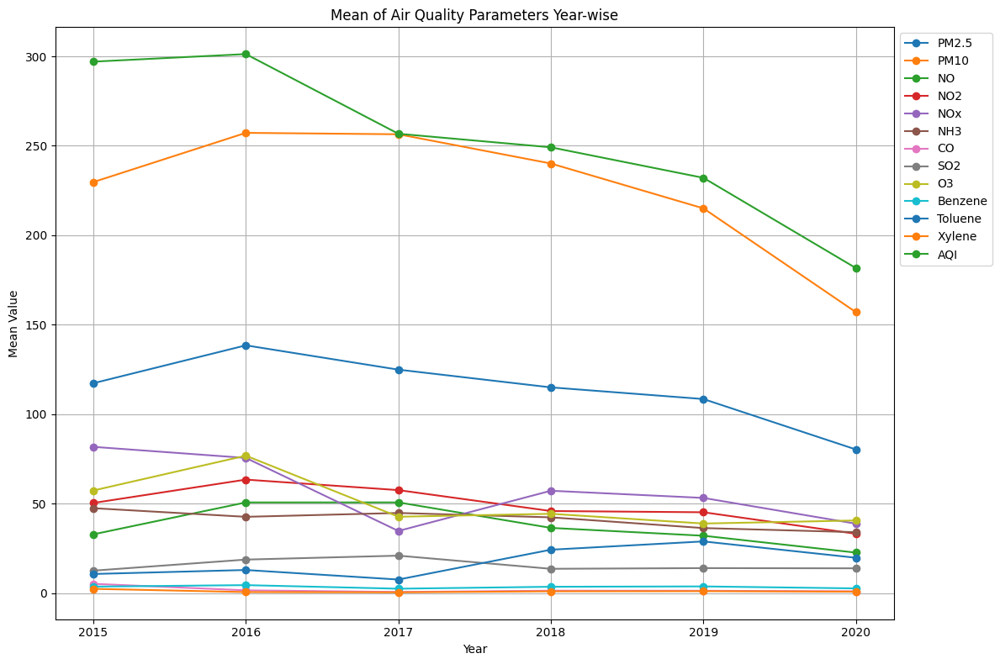

In [21]:
# Grouping data by year and calculating the mean for each feature
mean_yearly_data = data.groupby('Year').mean()

# Plotting mean of each feature year-wise
plt.figure(figsize=(12, 8))
for feature in mean_yearly_data.columns:
    plt.plot(mean_yearly_data.index, mean_yearly_data[feature], marker='o', label=feature)

plt.title('Mean of Air Quality Parameters Year-wise')
plt.xlabel('Year')
plt.ylabel('Mean Value')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.xticks(mean_yearly_data.index)
plt.tight_layout()
plt.show()

# **USING RANDOM FOREST ALGORITHM**

In [22]:
data

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,Year
0,Delhi,2015-01-01,313.22,607.98,69.16,36.39,110.59,33.85,15.20,9.25,41.68,14.36,24.86,9.84,472.0,Severe,2015
1,Delhi,2015-01-02,186.18,269.55,62.09,32.87,88.14,31.83,9.54,6.65,29.97,10.55,20.09,4.29,454.0,Severe,2015
2,Delhi,2015-01-03,87.18,131.90,25.73,30.31,47.95,69.55,10.61,2.65,19.71,3.91,10.23,1.99,143.0,Moderate,2015
3,Delhi,2015-01-04,151.84,241.84,25.01,36.91,48.62,130.36,11.54,4.63,25.36,4.26,9.71,3.34,319.0,Very Poor,2015
4,Delhi,2015-01-05,146.60,219.13,14.01,34.92,38.25,122.88,9.20,3.33,23.20,2.80,6.21,2.96,325.0,Very Poor,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,Delhi,2020-06-27,39.80,155.94,10.88,21.46,22.47,31.43,0.87,10.38,18.88,1.69,19.99,0.43,112.0,Moderate,2020
2005,Delhi,2020-06-28,59.52,308.65,12.67,21.60,23.86,29.27,0.94,10.70,18.05,1.71,25.13,1.74,196.0,Moderate,2020
2006,Delhi,2020-06-29,44.86,184.12,10.50,21.57,21.94,27.97,0.88,11.58,26.61,2.13,23.80,1.13,233.0,Poor,2020
2007,Delhi,2020-06-30,39.80,91.98,5.99,17.96,15.44,28.48,0.84,10.51,37.29,1.57,16.37,0.49,114.0,Moderate,2020


In [23]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Define features (X) and target variable (y)
X = data[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']]
y = data['AQI']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the Random Forest model
rf_regressor.fit(X_train, y_train)

# Predict the AQI for the test set
y_pred = rf_regressor.predict(X_test)

# Evaluate the performance of the model
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)


Mean Squared Error: 1005.4431639027085


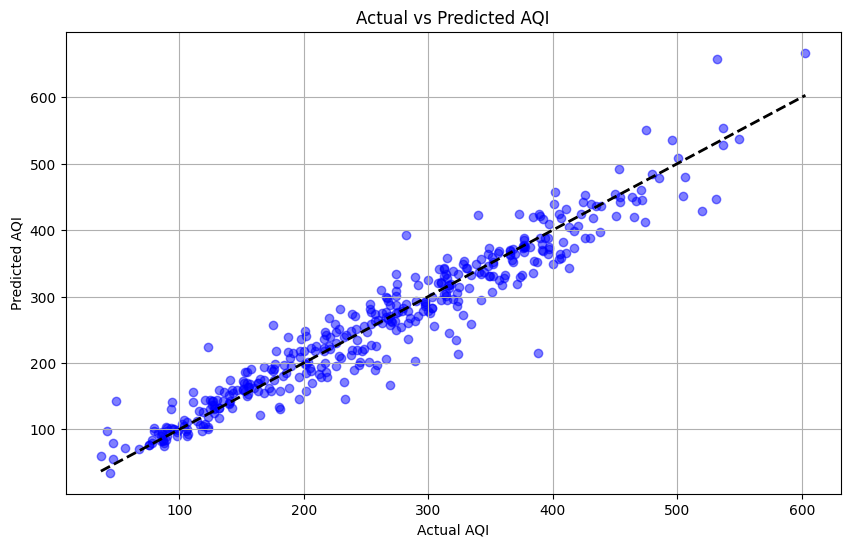

In [24]:
plt.figure(figsize=(10, 6))

# Plotting actual vs predicted AQI values
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Plotting the diagonal line

plt.title('Actual vs Predicted AQI')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.grid(True)
plt.show()


# **Forecasting AQI**

In [25]:
# Extracting 'Date' and 'AQI' columns
prophet_data = data[['Date', 'AQI']].copy()

# Renaming columns to match Prophet's requirements
prophet_data.columns = ['ds', 'y']

# Displaying the first few rows of the prepared data
print(prophet_data.head())

          ds      y
0 2015-01-01  472.0
1 2015-01-02  454.0
2 2015-01-03  143.0
3 2015-01-04  319.0
4 2015-01-05  325.0


In [26]:
from prophet import Prophet

# Initialize Prophet model
model = Prophet()

# Fit the model to the data
model.fit(prophet_data)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/c7l6n9y8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/uzkvzki_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70012', 'data', 'file=/tmp/tmpjkpd6tbm/c7l6n9y8.json', 'init=/tmp/tmpjkpd6tbm/uzkvzki_.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_model1k8p2s5w/prophet_model-20240216125149.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:51:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:51:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [27]:
# Finding the maximum date in the dataset
max_date = prophet_data['ds'].max()

# Making future predictions starting from the day after the maximum date
future_dates = pd.date_range(start=max_date + pd.Timedelta(days=1), periods=1825, freq='D')

# Creating a DataFrame for the future dates
future_df = pd.DataFrame({'ds': future_dates})

# Displaying the first few rows of the future dates DataFrame
print(future_df.head())


          ds
0 2020-07-02
1 2020-07-03
2 2020-07-04
3 2020-07-05
4 2020-07-06


In [28]:
# Making predictions for the future dates
forecast = model.predict(future_df)

# Displaying the first few rows of the forecast DataFrame
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())


          ds       yhat  yhat_lower  yhat_upper
0 2020-07-02  66.696518  -20.714195  153.107752
1 2020-07-03  66.700288  -20.614401  154.973110
2 2020-07-04  59.147761  -31.290463  148.186819
3 2020-07-05  52.884986  -30.633198  153.915587
4 2020-07-06  47.548490  -41.462204  136.639480


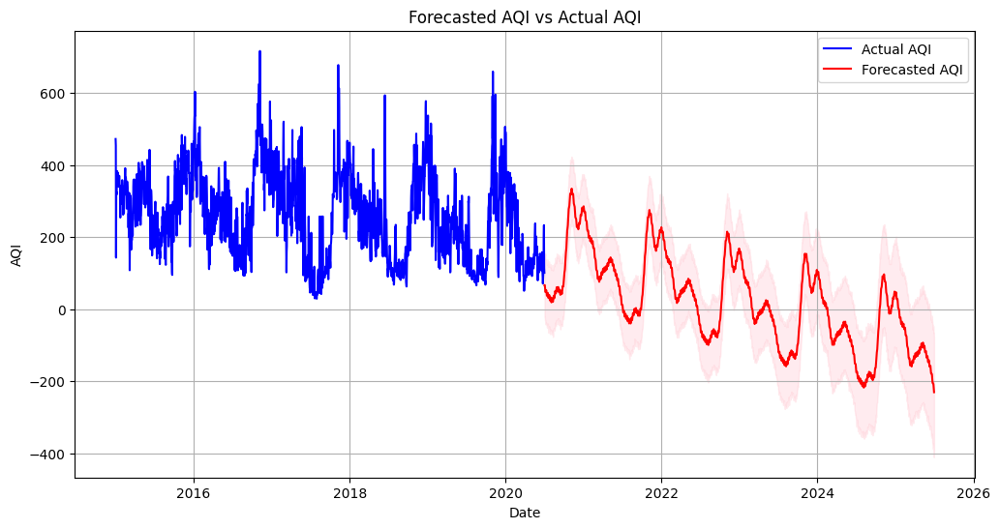

In [29]:
# Plotting the actual AQI values
plt.figure(figsize=(12, 6))
plt.plot(prophet_data['ds'], prophet_data['y'], label='Actual AQI', color='blue')

# Plotting the forecasted values
plt.plot(forecast['ds'], forecast['yhat'], label='Forecasted AQI', color='red')

# Plotting the prediction intervals
plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], color='pink', alpha=0.3)

# Adding labels and title
plt.title('Forecasted AQI vs Actual AQI')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


In [30]:
# Extracting the forecasted values and prediction intervals
forecast_df = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

# Saving the forecasted values to a CSV file
forecast_df.to_csv('forecasted_aqi.csv', index=False)

print("Forecasted values saved to 'forecasted_aqi.csv'.")


Forecasted values saved to 'forecasted_aqi.csv'.


# **Forecasting PM2.5**

In [31]:
# Extracting 'Date' and 'PM2.5' columns
pm25_data = data[['Date', 'PM2.5']].copy()

# Renaming columns to match Prophet's requirements
pm25_data.columns = ['ds', 'y']

# Displaying the first few rows of the prepared data
print(pm25_data.head())


          ds       y
0 2015-01-01  313.22
1 2015-01-02  186.18
2 2015-01-03   87.18
3 2015-01-04  151.84
4 2015-01-05  146.60


In [32]:
# Initialize Prophet model
pm25_model = Prophet()

# Fit the model to the data
pm25_model.fit(pm25_data)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/wvxfkcgs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/f24oa871.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73544', 'data', 'file=/tmp/tmpjkpd6tbm/wvxfkcgs.json', 'init=/tmp/tmpjkpd6tbm/f24oa871.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelwtvs8_aa/prophet_model-20240216125211.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [33]:
# Making future predictions for the next 365 days
future_pm25_dates = pm25_model.make_future_dataframe(periods=1825)

# Making predictions for the future dates
pm25_forecast = pm25_model.predict(future_pm25_dates)

# Displaying the first few rows of the forecast DataFrame
print(pm25_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())


          ds        yhat  yhat_lower  yhat_upper
0 2015-01-01  230.961907  168.754189  294.649709
1 2015-01-02  228.560609  164.278664  287.485012
2 2015-01-03  225.597209  162.807313  290.797065
3 2015-01-04  223.315088  162.610508  284.005147
4 2015-01-05  220.199883  154.954232  283.864503


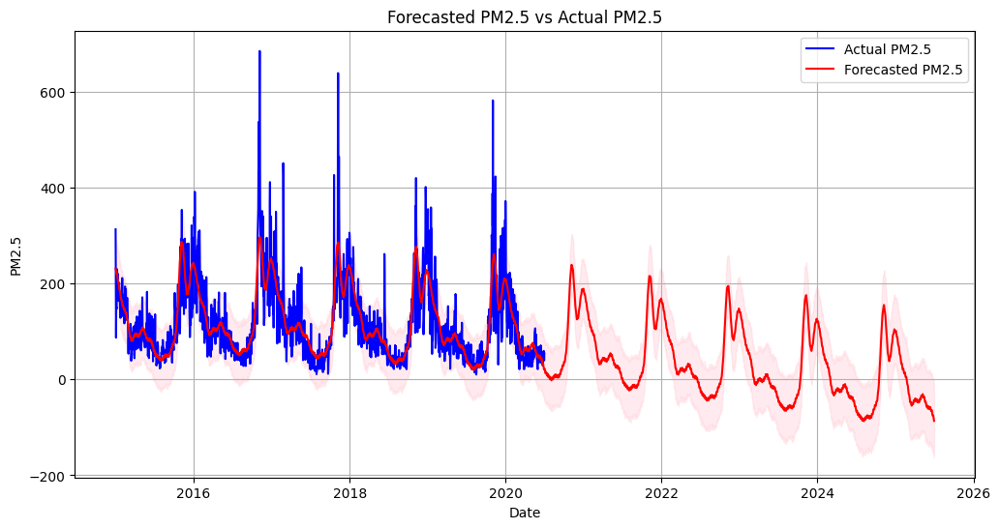

In [34]:
# Plotting the actual PM2.5 values
plt.figure(figsize=(12, 6))
plt.plot(pm25_data['ds'], pm25_data['y'], label='Actual PM2.5', color='blue')

# Plotting the forecasted values
plt.plot(pm25_forecast['ds'], pm25_forecast['yhat'], label='Forecasted PM2.5', color='red')

# Plotting the prediction intervals
plt.fill_between(pm25_forecast['ds'], pm25_forecast['yhat_lower'], pm25_forecast['yhat_upper'], color='pink', alpha=0.3)

# Adding labels and title
plt.title('Forecasted PM2.5 vs Actual PM2.5')
plt.xlabel('Date')
plt.ylabel('PM2.5')
plt.legend()
plt.grid(True)
plt.show()


In [35]:
# Extracting the forecasted values and prediction intervals
pm25_forecast_df = pm25_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

# Saving the forecasted values to a CSV file
pm25_forecast_df.to_csv('forecasted_pm25.csv', index=False)

print("Forecasted PM2.5 values saved to 'forecasted_pm25.csv'.")


Forecasted PM2.5 values saved to 'forecasted_pm25.csv'.


# **Forecasting PM10**

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/zl6nm336.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/l5x9vhtk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97549', 'data', 'file=/tmp/tmpjkpd6tbm/zl6nm336.json', 'init=/tmp/tmpjkpd6tbm/l5x9vhtk.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelf9kl8ro4/prophet_model-20240216125225.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


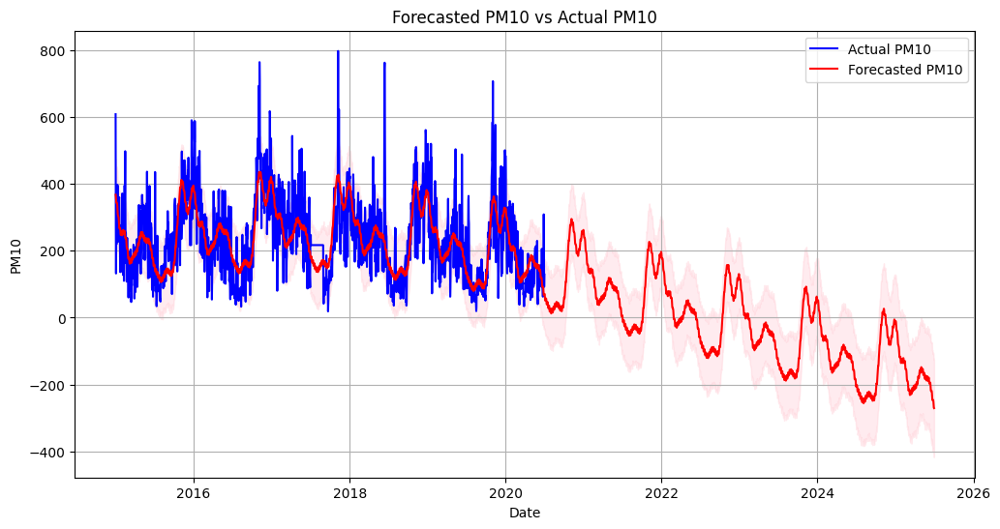

Forecasted PM10 values saved to 'forecasted_pm10.csv'.


In [36]:
# Prepare data for PM10 forecasting
pm10_data = data[['Date', 'PM10']].copy()
pm10_data.columns = ['ds', 'y']

# Initialize and fit the Prophet model for PM10
pm10_model = Prophet()
pm10_model.fit(pm10_data)

# Make future predictions for PM10
future_pm10_dates = pm10_model.make_future_dataframe(periods=1825)
pm10_forecast = pm10_model.predict(future_pm10_dates)

# Plotting the forecasted PM10 values alongside the actual values
plt.figure(figsize=(12, 6))
plt.plot(pm10_data['ds'], pm10_data['y'], label='Actual PM10', color='blue')
plt.plot(pm10_forecast['ds'], pm10_forecast['yhat'], label='Forecasted PM10', color='red')
plt.fill_between(pm10_forecast['ds'], pm10_forecast['yhat_lower'], pm10_forecast['yhat_upper'], color='pink', alpha=0.3)
plt.title('Forecasted PM10 vs Actual PM10')
plt.xlabel('Date')
plt.ylabel('PM10')
plt.legend()
plt.grid(True)
plt.show()

# Save the forecasted PM10 values to a CSV file
pm10_forecast_df = pm10_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
pm10_forecast_df.to_csv('forecasted_pm10.csv', index=False)
print("Forecasted PM10 values saved to 'forecasted_pm10.csv'.")

# **Forecasting NO**

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/1clobmps.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/qvqqmazr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2896', 'data', 'file=/tmp/tmpjkpd6tbm/1clobmps.json', 'init=/tmp/tmpjkpd6tbm/qvqqmazr.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modeli1ypad2t/prophet_model-20240216125233.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


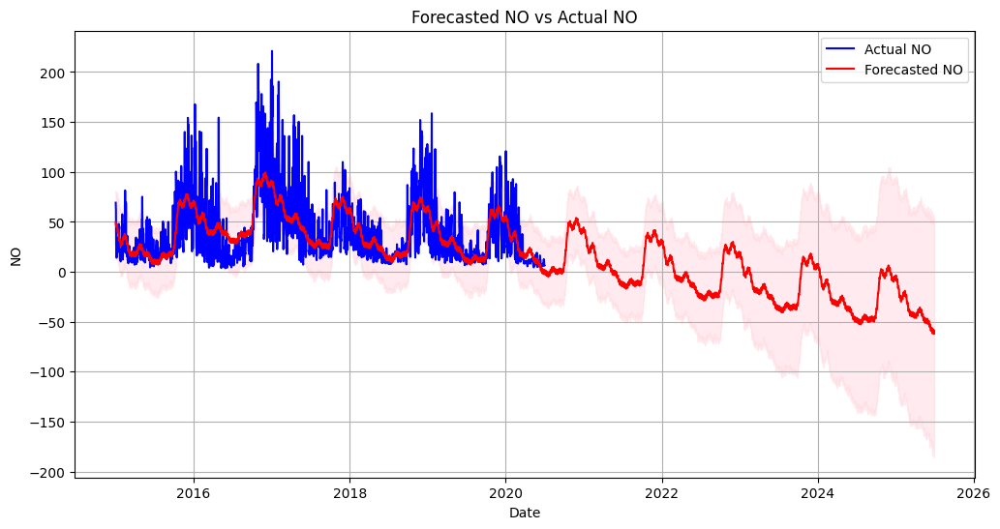

Forecasted NO values saved to 'forecasted_no.csv'.


In [37]:
# Prepare data for NO forecasting
no_data = data[['Date', 'NO']].copy()
no_data.columns = ['ds', 'y']

# Initialize and fit the Prophet model for NO
no_model = Prophet()
no_model.fit(no_data)

# Make future predictions for NO
future_no_dates = no_model.make_future_dataframe(periods=1825)
no_forecast = no_model.predict(future_no_dates)

# Plotting the forecasted NO values alongside the actual values
plt.figure(figsize=(12, 6))
plt.plot(no_data['ds'], no_data['y'], label='Actual NO', color='blue')
plt.plot(no_forecast['ds'], no_forecast['yhat'], label='Forecasted NO', color='red')
plt.fill_between(no_forecast['ds'], no_forecast['yhat_lower'], no_forecast['yhat_upper'], color='pink', alpha=0.3)
plt.title('Forecasted NO vs Actual NO')
plt.xlabel('Date')
plt.ylabel('NO')
plt.legend()
plt.grid(True)
plt.show()

# Save the forecasted NO values to a CSV file
no_forecast_df = no_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
no_forecast_df.to_csv('forecasted_no.csv', index=False)
print("Forecasted NO values saved to 'forecasted_no.csv'.")

# **ALL OTHER FACTORS**

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/k0ui_txj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/m5mpr9m_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9093', 'data', 'file=/tmp/tmpjkpd6tbm/k0ui_txj.json', 'init=/tmp/tmpjkpd6tbm/m5mpr9m_.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_model5n_29e4e/prophet_model-20240216125239.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


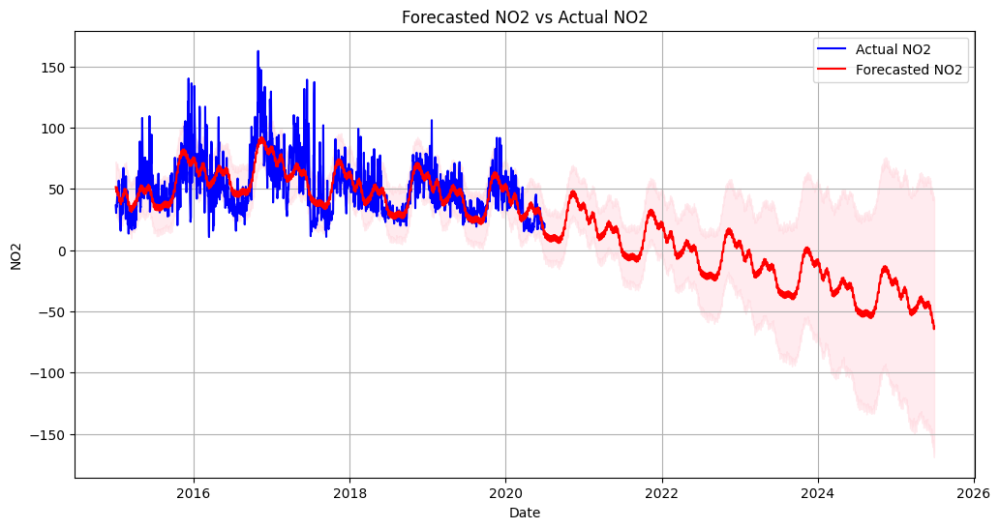

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/36qum__a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/w0boapp3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99596', 'data', 'file=/tmp/tmpjkpd6tbm/36qum__a.json', 'init=/tmp/tmpjkpd6tbm/w0boapp3.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelxo1hgbem/prophet_model-20240216125241.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Forecasted NO2 values saved to 'forecasted_no2.csv'.


12:52:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


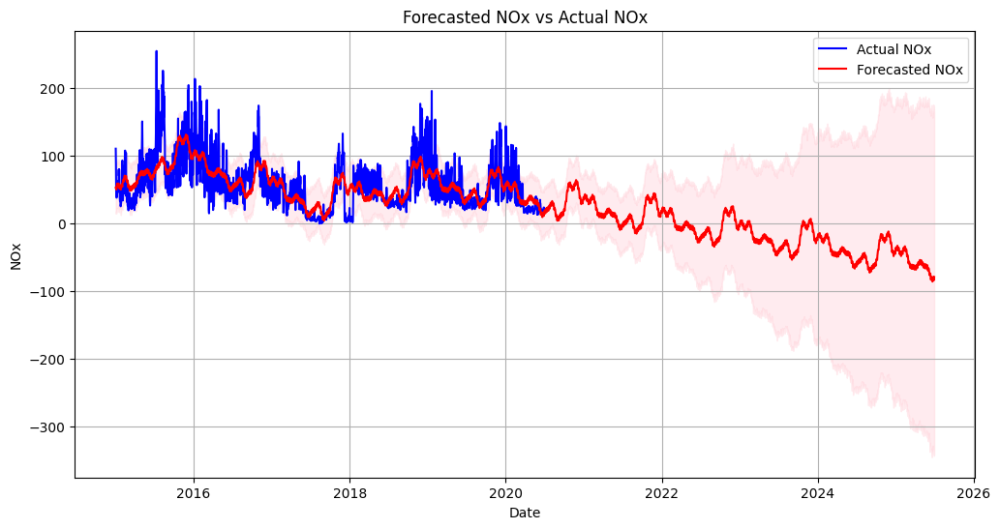

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/v4ibvsz6.json


Forecasted NOx values saved to 'forecasted_nox.csv'.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/_9m0y13p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61261', 'data', 'file=/tmp/tmpjkpd6tbm/v4ibvsz6.json', 'init=/tmp/tmpjkpd6tbm/_9m0y13p.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelbv5v5s1z/prophet_model-20240216125243.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


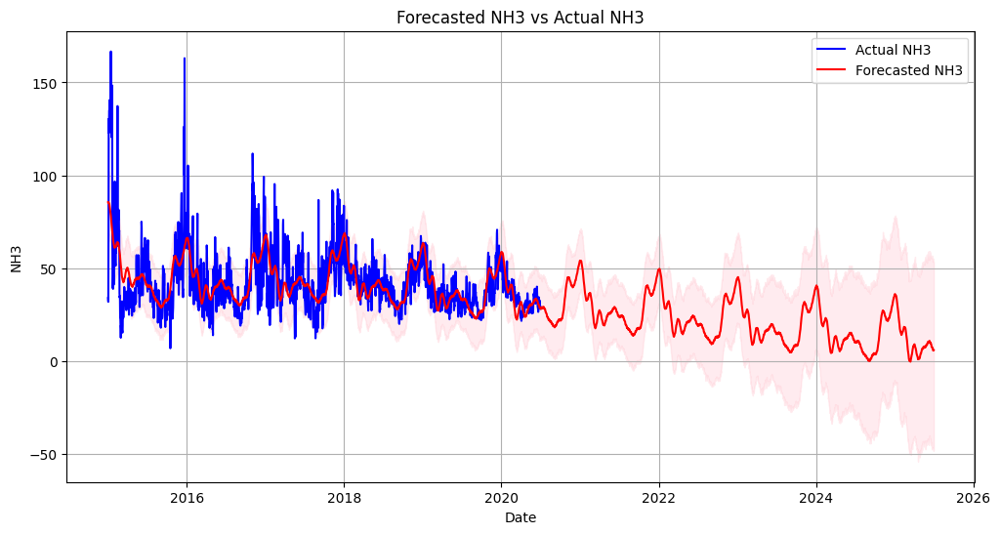

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/31v3j7mp.json


Forecasted NH3 values saved to 'forecasted_nh3.csv'.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/z1nqxu1x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14436', 'data', 'file=/tmp/tmpjkpd6tbm/31v3j7mp.json', 'init=/tmp/tmpjkpd6tbm/z1nqxu1x.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_model8trdqv82/prophet_model-20240216125246.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


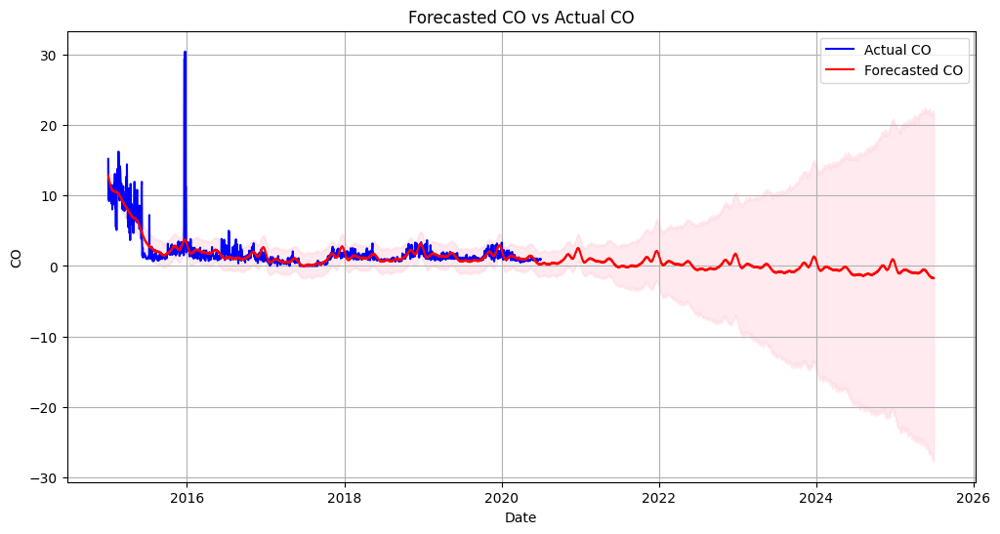

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/qsv4bvzf.json


Forecasted CO values saved to 'forecasted_co.csv'.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/qnkd2b7k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83887', 'data', 'file=/tmp/tmpjkpd6tbm/qsv4bvzf.json', 'init=/tmp/tmpjkpd6tbm/qnkd2b7k.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modeljy9y6xre/prophet_model-20240216125248.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


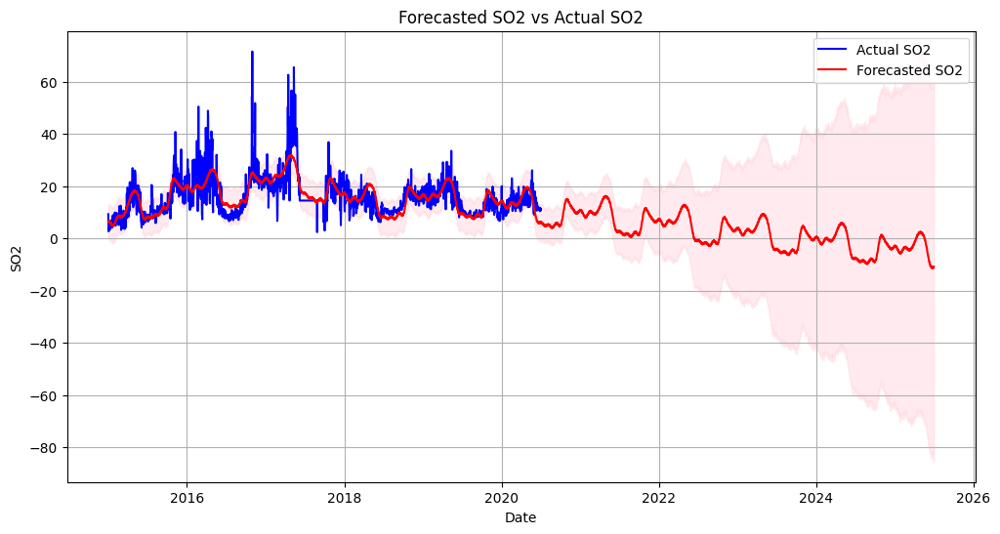

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/3ztuhxyk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/e2w2_wbs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22295', 'data', 'file=/tmp/tmpjkpd6tbm/3ztuhxyk.json', 'init=/tmp/tmpjkpd6tbm/e2w2_wbs.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelx4lpi8oi/prophet_model-20240216125250.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:50 - cmdstanpy - INFO - Chain [1] start processing


Forecasted SO2 values saved to 'forecasted_so2.csv'.


INFO:cmdstanpy:Chain [1] start processing
12:52:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


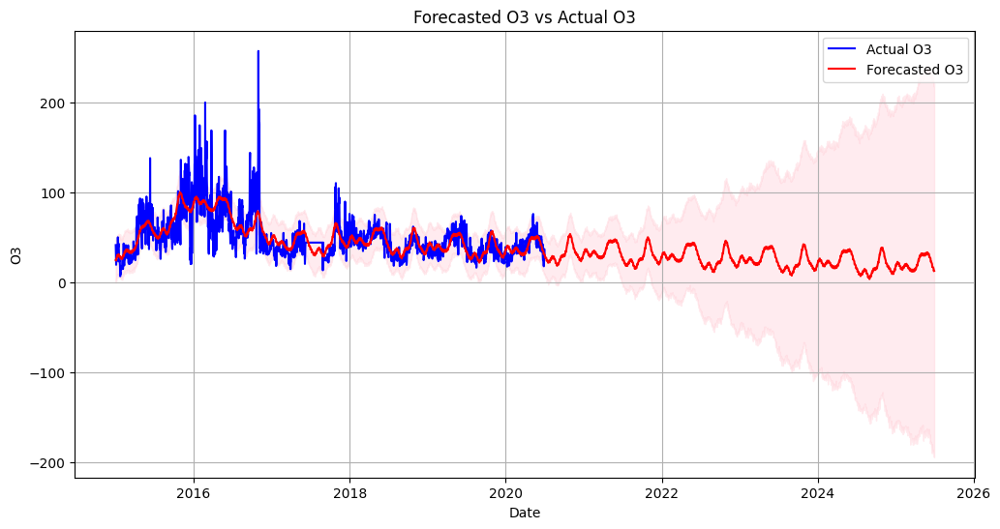

Forecasted O3 values saved to 'forecasted_o3.csv'.


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/q_gbo9pz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/_g5ycxc0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43396', 'data', 'file=/tmp/tmpjkpd6tbm/q_gbo9pz.json', 'init=/tmp/tmpjkpd6tbm/_g5ycxc0.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelrcy_x7v5/prophet_model-20240216125253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


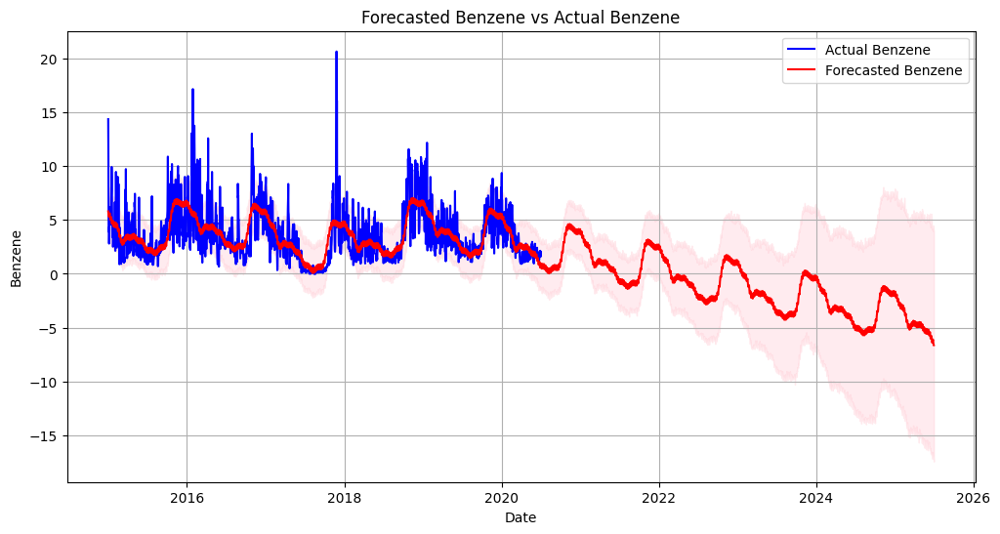

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/_xqlf8ww.json


Forecasted Benzene values saved to 'forecasted_benzene.csv'.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/3syyfz6c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69824', 'data', 'file=/tmp/tmpjkpd6tbm/_xqlf8ww.json', 'init=/tmp/tmpjkpd6tbm/3syyfz6c.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_model3xc3x7y4/prophet_model-20240216125255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


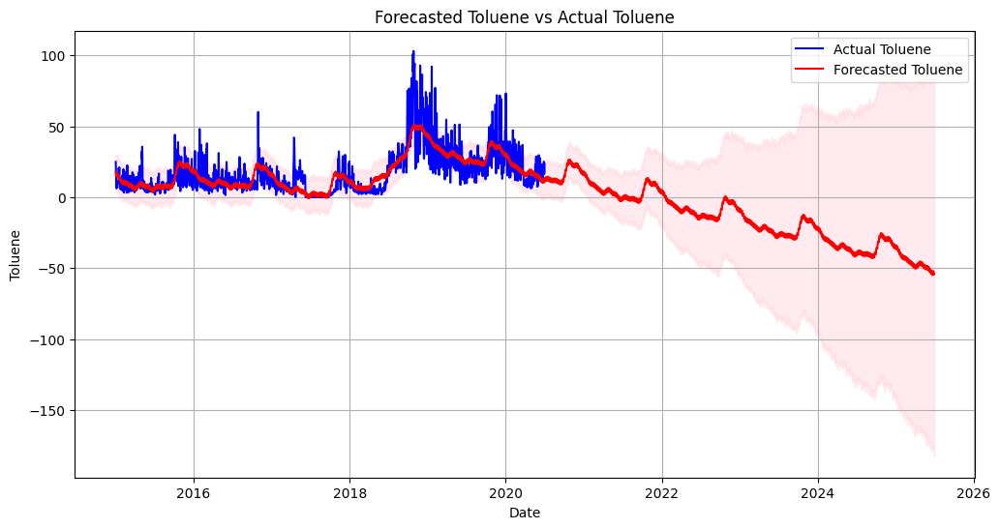

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/jbhbk5x4.json


Forecasted Toluene values saved to 'forecasted_toluene.csv'.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/0il7chcq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26121', 'data', 'file=/tmp/tmpjkpd6tbm/jbhbk5x4.json', 'init=/tmp/tmpjkpd6tbm/0il7chcq.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelw7wt8efj/prophet_model-20240216125257.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


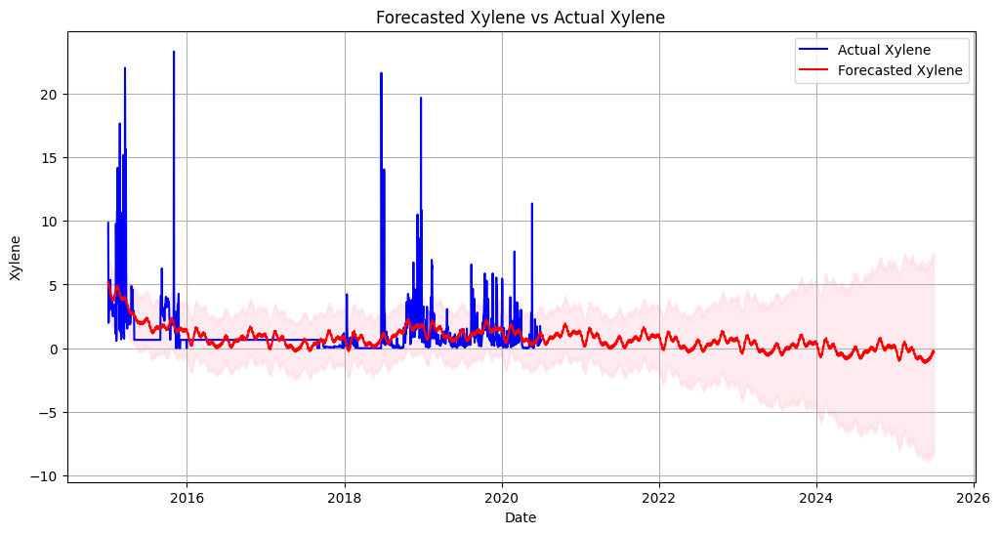

Forecasted Xylene values saved to 'forecasted_xylene.csv'.


In [38]:
# List of factors to forecast
factors = ['NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']

for factor in factors:
    # Prepare data for the current factor
    factor_data = data[['Date', factor]].copy()
    factor_data.columns = ['ds', 'y']

    # Initialize and fit the Prophet model for the current factor
    factor_model = Prophet()
    factor_model.fit(factor_data)

    # Make future predictions for the current factor
    future_factor_dates = factor_model.make_future_dataframe(periods=1825)
    factor_forecast = factor_model.predict(future_factor_dates)

    # Plotting the forecasted factor values alongside the actual values
    plt.figure(figsize=(12, 6))
    plt.plot(factor_data['ds'], factor_data['y'], label=f'Actual {factor}', color='blue')
    plt.plot(factor_forecast['ds'], factor_forecast['yhat'], label=f'Forecasted {factor}', color='red')
    plt.fill_between(factor_forecast['ds'], factor_forecast['yhat_lower'], factor_forecast['yhat_upper'], color='pink', alpha=0.3)
    plt.title(f'Forecasted {factor} vs Actual {factor}')
    plt.xlabel('Date')
    plt.ylabel(factor)
    plt.legend()
    plt.grid(True)
    plt.show()

    # Save the forecasted factor values to a CSV file
    factor_forecast_df = factor_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    factor_forecast_df.to_csv(f'forecasted_{factor.lower()}.csv', index=False)
    print(f"Forecasted {factor} values saved to 'forecasted_{factor.lower()}.csv'.")




# **Single Graph All Forecasting**


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/fitr62we.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/qve74hym.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4766', 'data', 'file=/tmp/tmpjkpd6tbm/fitr62we.json', 'init=/tmp/tmpjkpd6tbm/qve74hym.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modeltnib2ut5/prophet_model-20240216125259.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:53:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkp

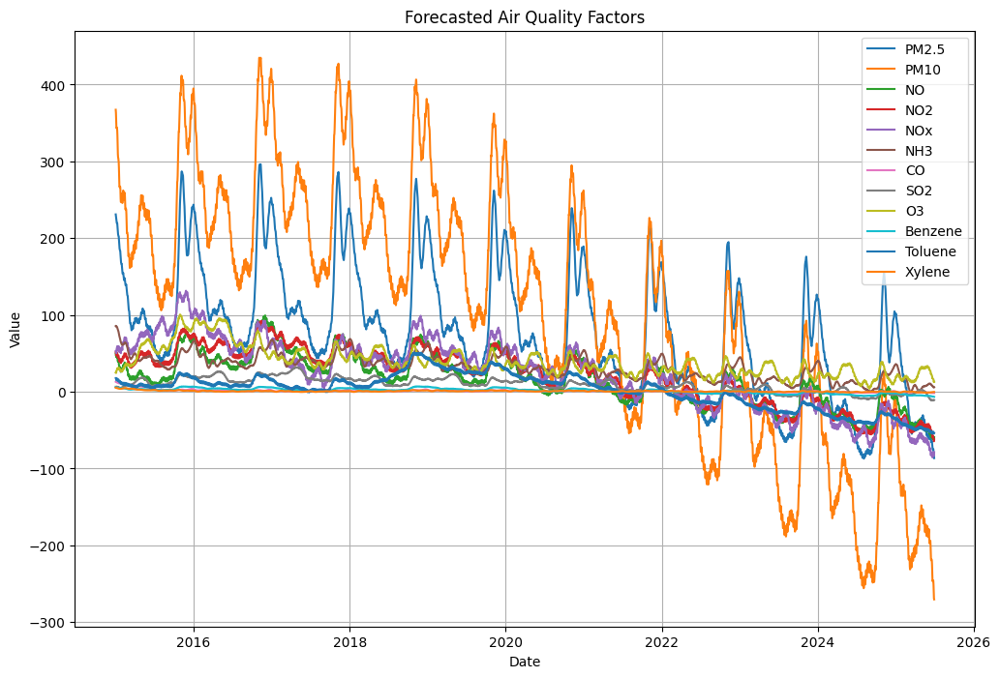

In [39]:
# List of factors to forecast
factors = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']

# Initialize the figure
plt.figure(figsize=(12, 8))

# Iterate over each factor
for factor in factors:
    # Prepare data for the current factor
    factor_data = data[['Date', factor]].copy()
    factor_data.columns = ['ds', 'y']

    # Initialize and fit the Prophet model for the current factor
    factor_model = Prophet()
    factor_model.fit(factor_data)

    # Make future predictions for the current factor
    future_factor_dates = factor_model.make_future_dataframe(periods=1825)
    factor_forecast = factor_model.predict(future_factor_dates)

    # Plotting the forecasted factor values
    plt.plot(factor_forecast['ds'], factor_forecast['yhat'], label=factor)

# Adding labels and title
plt.title('Forecasted Air Quality Factors')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

In [40]:
# List of factors to forecast
factors = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']

# Initialize an empty DataFrame to store forecasted values
forecasted_data = pd.DataFrame()

# Iterate over each factor
for factor in factors:
    # Prepare data for the current factor
    factor_data = data[['Date', factor]].copy()
    factor_data.columns = ['ds', 'y']

    # Initialize and fit the Prophet model for the current factor
    factor_model = Prophet()
    factor_model.fit(factor_data)

    # Make future predictions for the current factor
    max_date = factor_data['ds'].max()
    future_factor_dates = factor_model.make_future_dataframe(periods=1825, freq='D', include_history=False)
    future_factor_dates = future_factor_dates[future_factor_dates['ds'] > max_date]  # Filter dates after the max date
    factor_forecast = factor_model.predict(future_factor_dates)

    # Add forecasted values to the DataFrame
    forecasted_data[factor] = factor_forecast['yhat']

# Include 'Date' and 'AQI' columns in the forecasted data
forecasted_data['Date'] = factor_forecast['ds']
forecasted_data['AQI'] = data['AQI']

# Reorder columns to have 'Date' and 'AQI' at the beginning
columns = ['Date', 'AQI'] + factors
forecasted_data = forecasted_data[columns]

# Save the forecasted values to a CSV file
forecasted_data.to_csv('Full_Forecasting.csv', index=False)
print("Forecasted factors with Date and AQI saved to 'Full_Forecasting.csv'.")

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/whck7481.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjkpd6tbm/yajque3k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21341', 'data', 'file=/tmp/tmpjkpd6tbm/whck7481.json', 'init=/tmp/tmpjkpd6tbm/yajque3k.json', 'output', 'file=/tmp/tmpjkpd6tbm/prophet_modelrxsuku0w/prophet_model-20240216125326.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:53:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:53:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjk

Forecasted factors with Date and AQI saved to 'Full_Forecasting.csv'.
